# Using Deep Learning to Quantify Fibrosis in Muscle Tissue
## Report Generation
## By Sergei Issaev

### EDIT HERE

In [1]:
model_number = '214'
date = 'test0305'
description = '''
cut it
'''
date_of_run = ["6/30/2021"]
inv_data_gen_args = dict()
# samplewise_std_normalization=True, samplewise_center=True

### END OF EDIT HERE

### Set Constants

In [2]:
train_file = '/home/sergei/projects/def-rogertam/sergei/micro_scans/data/traintest/diaphragmsmarinefascia4/train_ali_full.npz'
test_file = '/home/sergei/projects/def-rogertam/sergei/micro_scans/data/traintest/diaphragmsmarinefascia4/test_ali_full.npz'
model_run = 'model_jul_24_full.h5'

### Import Libraries

In [3]:
from datetime import date
from keras.models import load_model
from keras.preprocessing.image import ImageDataGenerator
from numpy import load
from numpy import vstack
from matplotlib import pyplot
from numpy.random import randint
import cv2  
import sys
sys.path.insert(1, '/project/def-rogertam/sergei/micro_scans/code_files/product')
import threshold_fx
import random
import matplotlib.pyplot as plt
import numpy as np  
import scipy.stats as stats
from scipy.stats import pearsonr
from scipy.spatial import distance
from skimage.metrics import (adapted_rand_error, variation_of_information)
from skimage import measure
import math
import statistics
from tqdm import tqdm
import pandas as pd
import datetime

### Initialize arrays

In [8]:
print('load and prepare training images')
def load_real_samples(filename):
    # load compressed ararys
    data = load(filename)
    # unpack arrays
    X1, X2 = data['arr_0'], data['arr_1']
    # scale from [0,255] to [-1,1]
    X1 = X1.astype(np.uint8)
    X2 = X2.astype(np.uint8)
    return [X1, X2]

def mse(imageA, imageB):
    # the 'Mean Squared Error' between the two images is the
    # sum of the squared difference between the two images;
    # NOTE: the two images must have the same dimension
    err = np.sum((imageA.astype("float") - imageB.astype("float")) ** 2)
    err /= float(imageA.shape[0] * imageA.shape[1])
    # return the MSE, the lower the error, the more "similar"
    # the two images are
    return err

invariant_datagen = ImageDataGenerator(**inv_data_gen_args)
dataset = load_real_samples(train_file)
print('Loaded', dataset[0].shape, dataset[1].shape)
trainA, trainB = dataset
invariant_datagen.fit(trainA, augment=True)


data = load(test_file)
[A1, A2] = data['arr_0'], data['arr_1'] 
X1 = A1.astype(np.uint8)
X2 = A2.astype(np.uint8)
print('Loaded', X1.shape)

samples = X1.shape[0]


load and prepare training images
Loaded (1553, 256, 256, 3) (1553, 256, 256, 3)
Loaded (173, 256, 256, 3)


In [9]:
l1 = []
l2 = []
corrs = []
stds = []
EDs = []
eustds = []
mses = []
mmsis = []
precision_list = []
recall_list = []
split_list = []
merge_list = []
error_list = []
pix_acc_list = []
iou_list = []
dice_list = []
curve_tar = []
curve_gen = []
pcc_sp = np.zeros((samples,1), dtype='float32')
ED = np.zeros((samples,1), dtype='float32')
dst = np.zeros((samples,1), dtype='float32')

In [10]:
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve

  1%|          | 2/173 [00:02<03:03,  1.07s/it]

white 51229
black 14307
total 65536
white_tar 51580
white 65536
black 0
total 65536
white_tar 65536


  2%|▏         | 4/173 [00:02<01:17,  2.18it/s]

white 44960
black 20576
total 65536
white_tar 44672
white 33808
black 31728
total 65536
white_tar 30040


  3%|▎         | 6/173 [00:03<00:47,  3.49it/s]

white 31712
black 33824
total 65536
white_tar 34199
white 39259
black 26277
total 65536
white_tar 37433


  4%|▍         | 7/173 [00:03<00:40,  4.09it/s]

white 65536
black 0
total 65536
white_tar 65536
white 13035
black 52501
total 65536
white_tar 17394


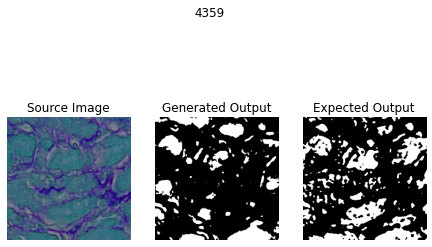

  6%|▌         | 10/173 [00:04<00:48,  3.36it/s]

white 37955
black 27581
total 65536
white_tar 38161
white 59360
black 6176
total 65536
white_tar 59423


  7%|▋         | 12/173 [00:04<00:36,  4.42it/s]

white 39468
black 26068
total 65536
white_tar 30930
white 36097
black 29439
total 65536
white_tar 38657


  8%|▊         | 14/173 [00:05<00:30,  5.26it/s]

white 48276
black 17260
total 65536
white_tar 48885
white 38878
black 26658
total 65536
white_tar 31509


  9%|▉         | 16/173 [00:05<00:27,  5.73it/s]

white 39842
black 25694
total 65536
white_tar 39836
white 40840
black 24696
total 65536
white_tar 42648


 10%|█         | 18/173 [00:05<00:25,  6.05it/s]

white 64188
black 1348
total 65536
white_tar 64220
white 35730
black 29806
total 65536
white_tar 31500


 12%|█▏        | 20/173 [00:06<00:24,  6.16it/s]

white 64167
black 1369
total 65536
white_tar 64140
white 28205
black 37331
total 65536
white_tar 32189


 13%|█▎        | 22/173 [00:06<00:23,  6.29it/s]

white 45474
black 20062
total 65536
white_tar 46554
white 41335
black 24201
total 65536
white_tar 40315


 14%|█▍        | 24/173 [00:06<00:23,  6.30it/s]

white 59154
black 6382
total 65536
white_tar 59175
white 65536
black 0
total 65536
white_tar 65536


 15%|█▌        | 26/173 [00:07<00:23,  6.29it/s]

white 51547
black 13989
total 65536
white_tar 51395
white 41485
black 24051
total 65536
white_tar 44051


 16%|█▌        | 28/173 [00:07<00:23,  6.29it/s]

white 64674
black 862
total 65536
white_tar 64690
white 42619
black 22917
total 65536
white_tar 41231


 17%|█▋        | 30/173 [00:07<00:22,  6.31it/s]

white 48839
black 16697
total 65536
white_tar 48962
white 50914
black 14622
total 65536
white_tar 50961


 18%|█▊        | 32/173 [00:08<00:22,  6.26it/s]

white 64975
black 561
total 65536
white_tar 65040
white 48724
black 16812
total 65536
white_tar 48706


 19%|█▉        | 33/173 [00:08<00:22,  6.31it/s]

white 63517
black 2019
total 65536
white_tar 63942
white 32433
black 33103
total 65536
white_tar 25609


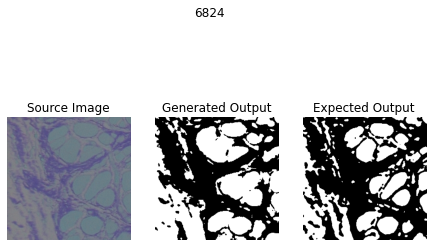

 21%|██        | 36/173 [00:11<01:44,  1.31it/s]

white 37425
black 28111
total 65536
white_tar 38739
white 53831
black 11705
total 65536
white_tar 54320


 22%|██▏       | 38/173 [00:11<01:01,  2.20it/s]

white 31026
black 34510
total 65536
white_tar 22725
white 60109
black 5427
total 65536
white_tar 59837


 23%|██▎       | 40/173 [00:12<00:40,  3.31it/s]

white 46152
black 19384
total 65536
white_tar 50196
white 37900
black 27636
total 65536
white_tar 41411


 24%|██▍       | 42/173 [00:12<00:30,  4.33it/s]

white 37201
black 28335
total 65536
white_tar 43577
white 26365
black 39171
total 65536
white_tar 21885


 25%|██▌       | 44/173 [00:12<00:25,  5.05it/s]

white 25340
black 40196
total 65536
white_tar 13251
white 33241
black 32295
total 65536
white_tar 34627


 27%|██▋       | 46/173 [00:13<00:22,  5.57it/s]

white 65536
black 0
total 65536
white_tar 65536
white 26882
black 38654
total 65536
white_tar 26925


 28%|██▊       | 48/173 [00:13<00:20,  5.95it/s]

white 41064
black 24472
total 65536
white_tar 38471
white 54047
black 11489
total 65536
white_tar 55887


 29%|██▉       | 50/173 [00:13<00:20,  6.08it/s]

white 26264
black 39272
total 65536
white_tar 21510
white 57780
black 7756
total 65536
white_tar 54015


 30%|███       | 52/173 [00:14<00:19,  6.23it/s]

white 54289
black 11247
total 65536
white_tar 56165
white 29024
black 36512
total 65536
white_tar 27450


 31%|███       | 54/173 [00:14<00:18,  6.27it/s]

white 65536
black 0
total 65536
white_tar 65536
white 50172
black 15364
total 65536
white_tar 43650


 32%|███▏      | 56/173 [00:14<00:18,  6.33it/s]

white 60388
black 5148
total 65536
white_tar 59900
white 31971
black 33565
total 65536
white_tar 30996


 34%|███▎      | 58/173 [00:15<00:18,  6.29it/s]

white 41375
black 24161
total 65536
white_tar 41501
white 47288
black 18248
total 65536
white_tar 48276


 35%|███▍      | 60/173 [00:15<00:17,  6.32it/s]

white 38934
black 26602
total 65536
white_tar 40470
white 24727
black 40809
total 65536
white_tar 24056


 36%|███▌      | 62/173 [00:15<00:17,  6.28it/s]

white 61732
black 3804
total 65536
white_tar 61973
white 34074
black 31462
total 65536
white_tar 36502


 37%|███▋      | 64/173 [00:16<00:17,  6.26it/s]

white 53668
black 11868
total 65536
white_tar 55455
white 62753
black 2783
total 65536
white_tar 63071


 38%|███▊      | 66/173 [00:16<00:17,  6.27it/s]

white 46278
black 19258
total 65536
white_tar 48520
white 55007
black 10529
total 65536
white_tar 54373


 39%|███▉      | 68/173 [00:16<00:16,  6.21it/s]

white 40825
black 24711
total 65536
white_tar 38986
white 41865
black 23671
total 65536
white_tar 40825


 40%|████      | 70/173 [00:17<00:16,  6.23it/s]

white 60879
black 4657
total 65536
white_tar 62019
white 56764
black 8772
total 65536
white_tar 49538


 42%|████▏     | 72/173 [00:17<00:16,  6.17it/s]

white 32864
black 32672
total 65536
white_tar 36429
white 31728
black 33808
total 65536
white_tar 36825


 43%|████▎     | 74/173 [00:17<00:15,  6.23it/s]

white 65536
black 0
total 65536
white_tar 65536
white 45617
black 19919
total 65536
white_tar 45262


 44%|████▍     | 76/173 [00:18<00:15,  6.17it/s]

white 58093
black 7443
total 65536
white_tar 58616
white 45714
black 19822
total 65536
white_tar 46438


 45%|████▌     | 78/173 [00:18<00:15,  6.23it/s]

white 44639
black 20897
total 65536
white_tar 47377
white 39746
black 25790
total 65536
white_tar 41743


 46%|████▌     | 80/173 [00:18<00:14,  6.22it/s]

white 62751
black 2785
total 65536
white_tar 63446
white 62534
black 3002
total 65536
white_tar 62750


 47%|████▋     | 82/173 [00:19<00:14,  6.20it/s]

white 29307
black 36229
total 65536
white_tar 32290
white 23842
black 41694
total 65536
white_tar 27174


 49%|████▊     | 84/173 [00:19<00:14,  6.22it/s]

white 28548
black 36988
total 65536
white_tar 28220
white 42861
black 22675
total 65536
white_tar 43200


 50%|████▉     | 86/173 [00:19<00:13,  6.31it/s]

white 30237
black 35299
total 65536
white_tar 33535
white 46849
black 18687
total 65536
white_tar 40514


 51%|█████     | 88/173 [00:19<00:13,  6.28it/s]

white 40267
black 25269
total 65536
white_tar 44009
white 52301
black 13235
total 65536
white_tar 53392


 52%|█████▏    | 90/173 [00:20<00:13,  6.33it/s]

white 32107
black 33429
total 65536
white_tar 22901
white 56603
black 8933
total 65536
white_tar 56335


 53%|█████▎    | 92/173 [00:20<00:12,  6.31it/s]

white 21331
black 44205
total 65536
white_tar 15068
white 61283
black 4253
total 65536
white_tar 61016


 54%|█████▍    | 94/173 [00:20<00:12,  6.30it/s]

white 32386
black 33150
total 65536
white_tar 34926
white 43850
black 21686
total 65536
white_tar 44454


 55%|█████▌    | 96/173 [00:21<00:12,  6.30it/s]

white 62252
black 3284
total 65536
white_tar 52601
white 26379
black 39157
total 65536
white_tar 30872


 57%|█████▋    | 98/173 [00:21<00:12,  6.22it/s]

white 57003
black 8533
total 65536
white_tar 56750
white 63746
black 1790
total 65536
white_tar 63724


 58%|█████▊    | 100/173 [00:21<00:11,  6.32it/s]

white 51480
black 14056
total 65536
white_tar 51011
white 35929
black 29607
total 65536
white_tar 27325


 59%|█████▉    | 102/173 [00:22<00:11,  6.28it/s]

white 38984
black 26552
total 65536
white_tar 42531
white 55805
black 9731
total 65536
white_tar 56926


 60%|██████    | 104/173 [00:22<00:10,  6.34it/s]

white 60009
black 5527
total 65536
white_tar 62914
white 53841
black 11695
total 65536
white_tar 55797


 61%|██████▏   | 106/173 [00:22<00:10,  6.30it/s]

white 33426
black 32110
total 65536
white_tar 36365
white 28347
black 37189
total 65536
white_tar 19483


 62%|██████▏   | 108/173 [00:23<00:10,  6.37it/s]

white 38376
black 27160
total 65536
white_tar 42375
white 61293
black 4243
total 65536
white_tar 56179


 64%|██████▎   | 110/173 [00:23<00:09,  6.34it/s]

white 48565
black 16971
total 65536
white_tar 52461
white 59766
black 5770
total 65536
white_tar 56344


 65%|██████▍   | 112/173 [00:23<00:09,  6.30it/s]

white 44680
black 20856
total 65536
white_tar 44752
white 24049
black 41487
total 65536
white_tar 37379


 66%|██████▌   | 114/173 [00:24<00:09,  6.19it/s]

white 56404
black 9132
total 65536
white_tar 57554
white 42527
black 23009
total 65536
white_tar 44562


 66%|██████▋   | 115/173 [00:24<00:09,  6.22it/s]

white 51569
black 13967
total 65536
white_tar 51927
white 65536
black 0
total 65536
white_tar 65536


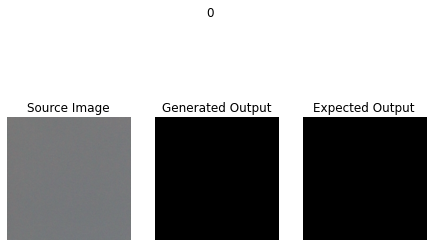

 68%|██████▊   | 118/173 [00:25<00:12,  4.45it/s]

white 28854
black 36682
total 65536
white_tar 23760
white 44319
black 21217
total 65536
white_tar 44457


 69%|██████▉   | 120/173 [00:25<00:10,  5.18it/s]

white 50409
black 15127
total 65536
white_tar 52136
white 60288
black 5248
total 65536
white_tar 62167


 71%|███████   | 122/173 [00:25<00:08,  5.68it/s]

white 51348
black 14188
total 65536
white_tar 52458
white 50885
black 14651
total 65536
white_tar 53022


 72%|███████▏  | 124/173 [00:26<00:08,  5.91it/s]

white 35184
black 30352
total 65536
white_tar 37973
white 24126
black 41410
total 65536
white_tar 21533


 73%|███████▎  | 126/173 [00:26<00:07,  6.07it/s]

white 58694
black 6842
total 65536
white_tar 56911
white 32120
black 33416
total 65536
white_tar 30782


 74%|███████▍  | 128/173 [00:26<00:07,  6.04it/s]

white 33462
black 32074
total 65536
white_tar 25000
white 40023
black 25513
total 65536
white_tar 27150


 75%|███████▌  | 130/173 [00:27<00:07,  5.77it/s]

white 64961
black 575
total 65536
white_tar 64938
white 43157
black 22379
total 65536
white_tar 42993


 76%|███████▋  | 132/173 [00:27<00:06,  5.96it/s]

white 63204
black 2332
total 65536
white_tar 63469
white 61079
black 4457
total 65536
white_tar 61171


 77%|███████▋  | 134/173 [00:27<00:06,  6.12it/s]

white 38991
black 26545
total 65536
white_tar 38443
white 55555
black 9981
total 65536
white_tar 55822


 79%|███████▊  | 136/173 [00:28<00:06,  6.11it/s]

white 48085
black 17451
total 65536
white_tar 47648
white 65536
black 0
total 65536
white_tar 65536


 80%|███████▉  | 138/173 [00:28<00:05,  6.05it/s]

white 44683
black 20853
total 65536
white_tar 44557
white 23243
black 42293
total 65536
white_tar 27333


 81%|████████  | 140/173 [00:28<00:05,  6.14it/s]

white 53327
black 12209
total 65536
white_tar 52197
white 45326
black 20210
total 65536
white_tar 43351


 82%|████████▏ | 142/173 [00:29<00:05,  6.16it/s]

white 36971
black 28565
total 65536
white_tar 35727
white 57287
black 8249
total 65536
white_tar 56981


 83%|████████▎ | 144/173 [00:29<00:04,  6.21it/s]

white 65536
black 0
total 65536
white_tar 65536
white 62849
black 2687
total 65536
white_tar 62768


 84%|████████▍ | 146/173 [00:29<00:04,  6.09it/s]

white 44716
black 20820
total 65536
white_tar 44957
white 32062
black 33474
total 65536
white_tar 22999


 86%|████████▌ | 148/173 [00:30<00:04,  6.21it/s]

white 56262
black 9274
total 65536
white_tar 57555
white 64240
black 1296
total 65536
white_tar 64076


 87%|████████▋ | 150/173 [00:30<00:03,  6.18it/s]

white 37221
black 28315
total 65536
white_tar 39042
white 44556
black 20980
total 65536
white_tar 45735


 88%|████████▊ | 152/173 [00:30<00:03,  6.31it/s]

white 36461
black 29075
total 65536
white_tar 38716
white 31224
black 34312
total 65536
white_tar 24289


 89%|████████▉ | 154/173 [00:31<00:03,  6.25it/s]

white 65072
black 464
total 65536
white_tar 65089
white 65536
black 0
total 65536
white_tar 65536


 90%|████████▉ | 155/173 [00:31<00:02,  6.24it/s]

white 24579
black 40957
total 65536
white_tar 30051


 91%|█████████ | 157/173 [00:31<00:02,  5.82it/s]

white 36632
black 28904
total 65536
white_tar 29567
white 64378
black 1158
total 65536
white_tar 64360


 92%|█████████▏| 159/173 [00:31<00:02,  6.05it/s]

white 38350
black 27186
total 65536
white_tar 41021
white 53922
black 11614
total 65536
white_tar 55919


 93%|█████████▎| 161/173 [00:32<00:01,  6.17it/s]

white 61147
black 4389
total 65536
white_tar 61722
white 59421
black 6115
total 65536
white_tar 59653


 94%|█████████▍| 163/173 [00:32<00:01,  6.29it/s]

white 59108
black 6428
total 65536
white_tar 59759
white 35299
black 30237
total 65536
white_tar 36199


 95%|█████████▌| 165/173 [00:32<00:01,  6.23it/s]

white 59442
black 6094
total 65536
white_tar 56126
white 59598
black 5938
total 65536
white_tar 59813


 97%|█████████▋| 167/173 [00:33<00:00,  6.32it/s]

white 65290
black 246
total 65536
white_tar 57684
white 48626
black 16910
total 65536
white_tar 48897


 97%|█████████▋| 168/173 [00:33<00:00,  6.33it/s]

white 32454
black 33082
total 65536
white_tar 29451
white 42446
black 23090
total 65536
white_tar 40961


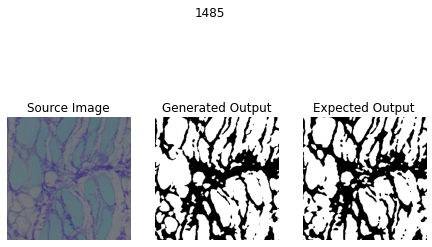

 98%|█████████▊| 170/173 [00:34<00:00,  4.01it/s]

white 36094
black 29442
total 65536
white_tar 44399
white 46248
black 19288
total 65536
white_tar 46980


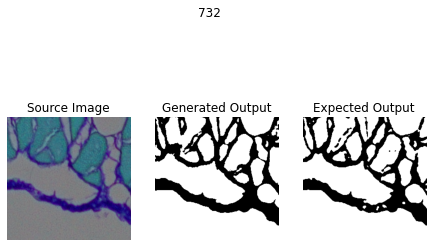

100%|██████████| 173/173 [00:35<00:00,  4.94it/s]

white 50533
black 15003
total 65536
white_tar 51155
white 62697
black 2839
total 65536
white_tar 58141


In [11]:
#%%time
###
### Don't forget to change the test set and the run date
###

model = load_model(model_run, compile=False)
for l in tqdm(range(samples)):

    src_image, tar_image = X1[[l]], X2[[l]]
    invariant_generator = invariant_datagen.flow(
    src_image)
    invariant_generator.next()


    invariant =  invariant_generator[0].copy()

    src_image = invariant  
    var = src_image
    src_image = src_image[:, :, :, 0]

    
    
    
    gen_image = model.predict(src_image)
    
    tar_image = tar_image[:, :, :, 0]
    

    gen_image = (gen_image >= 0.5).astype(np.uint8)
    white = np.count_nonzero(gen_image == 1)
    black = (256 * 256) - white
    print('white', white)
    print('black', black)
    print('total', 256 * 256)
    white_tar = np.count_nonzero(tar_image == 255)
    print('white_tar', white_tar)
    black_tar = (256 * 256) - white_tar
    
  


    gen_calc = black
    true_calc = black_tar
    l1.append(gen_calc)
    l2.append(true_calc)
    
    num = random.randint(0, 100)
    if num > 95: 
        fig, ax = plt.subplots(nrows = 1, ncols = 3, figsize = (7.5, 5))
        fig.suptitle(f"{abs(black-black_tar)}")
        ax[0].set_title(f'Source Image')
        ax[0].imshow(var.astype(np.uint8).squeeze(), cmap='gray')
        ax[0].axis('off')
        ax[1].set_title('Generated Output')
        ax[1].imshow(gen_image.squeeze(), cmap='gray')
        ax[1].axis('off')
        ax[2].set_title('Expected Output')
        ax[2].imshow(tar_image.squeeze(), cmap='gray')
        ax[2].axis('off')
        plt.show()

    tp = 0
    tn = 0
    fp = 0
    fn = 0
    for i in range(tar_image.squeeze().shape[0]):
        #print('looping for', tar_image.squeeze().shape[0])
        gen_pix = gen_image.flatten()[i]
        tar_pix = tar_image.flatten()[i]

        if gen_pix == 0:
            if tar_pix == 0:

                tp += 1
            else:

                fp += 1
        elif gen_pix == 1:
            if tar_pix == 255:

                tn += 1
            else:

                fn += 1
    try:
        pix_acc = (tp + tn) / (tp + tn + fp + fn)

        iou = tp / (tp + fp + fn)
        dice = (2 * tp) / ((2 * tp) + fp + fn)
    except:
        pix_acc = 1
        iou = 1
    pix_acc_list.append(pix_acc)
    iou_list.append(iou)
    dice_list.append(dice)

In [ ]:
tp = 0
tn = 0
fp = 0
fn = 0
for i in range(tar_image.squeeze().shape[0]):
    #print('looping for', tar_image.squeeze().shape[0])
    gen_pix = gen_image.flatten()[i]
    tar_pix = tar_image.flatten()[i]

    if gen_pix == 0:
        if tar_pix == 0:

            tp += 1
        else:

            fp += 1
    elif gen_pix == 1:
        if tar_pix == 255:

            tn += 1
        else:

            fn += 1
try:
    pix_acc = (tp + tn) / (tp + tn + fp + fn)

    iou = tp / (tp + fp + fn)
    dice = (2 * tp) / ((2 * tp) + fp + fn)
except:
    pix_acc = 1
    iou = 1
pix_acc_list.append(pix_acc)
iou_list.append(iou)
dice_list.append(dice)


In [ ]:
iou_list

In [ ]:
avg_dst = np.average(dst, axis = 0)
std_dst = np.std(dst, axis = 0)

avg = np.average(pcc_sp, axis = 0)
std = np.std(pcc_sp, axis = 0)
pcc_score  = str(avg)
pcc_std = str(std)


diff = 0
diffuse = list()
for i in range(samples):
    diffuse.append(abs(l1[i] - l2[i]))
diff = np.sum(diffuse)
mean_errorcalc = np.mean(diffuse)
std_errorcalc = np.std(diffuse)
diffr = 0
for i in range(len(l1)):
    diffr += (l1[i] - l2[i])
correlation, p_value = stats.pearsonr(l1, l2)

pix_acc_mean = statistics.mean(pix_acc_list)
miou = statistics.mean(iou_list)
dice_mean = statistics.mean(dice_list)

print(f"PCC score: {round(float(avg[0]), 2)} with standard deviation {round(float(std[0]), 2)}.")
print(f"FQM absolute difference per sample: {round(diff / samples, 2)} with standard deviation {round(std_errorcalc, 2)}.\nFQM balanced difference per sample: {round(diffr / samples, 2)}.\nFQM correlation: {round(correlation, 4)}.")
print(f"Euclidean distance: {round(float(avg_dst[0]), 2)}, with std {round(float(std_dst[0]), 2)}")
print(f"MSE {round(float(np.mean(mses)), 2)}, with std {round(float(np.std(mses)), 2)}")
print(f"SSMI {round(float(np.mean(mmsis)), 2)}, with std {round(float(np.std(mmsis)), 2)}")
print('pix acc mean is ', pix_acc_mean)
print('miou is ', miou)

In [12]:
#%%time
###
### Don't forget to change the test set and the run date
###

model = load_model(model_run, compile=False)
for l in tqdm(range(samples)):

    src_image, tar_image = X1[[l]], X2[[l]]
    invariant_generator = invariant_datagen.flow(
    src_image)
    invariant_generator.next()


    invariant =  invariant_generator[0].copy()

    src_image = invariant  
    src_image = src_image[:, :, :, 0]
    
    
    
    
    gen_image = model.predict(src_image)
    gen = (gen_image + abs(gen_image.min())) / 2.0
    white, black, thresh1 = threshold_fx.threshold_fx(A1, l, 0)
    if white != 0:
        gen_calc, threshgen = threshold_fx.threshold_gen(gen, white)
        true_calc, threshtar = threshold_fx.threshold_gen(tar_image, white)   
    else:
        gen_calc = 0
        true_calc = 0
        threshgen = np.full((thresh1.shape), 255)
        threshtar = np.full((thresh1.shape), 255)
    if np.mean(threshtar) == 0:
        true_calc = 0
        threshtar = np.full((thresh1.shape), 255)
    
    l1.append(gen_calc)
    l2.append(true_calc)
    
    
    
    src = cv2.cvtColor(src_image.squeeze(), cv2.COLOR_BGR2RGB)

    gen = np.array(threshgen)
    tar = np.array(threshtar)
    
    a = gen
    b = tar

    c = np.array((a-np.min(a))/(np.max(a)-np.min(a)))
    d = np.array((b-np.min(b))/(np.max(b)-np.min(b)))

    m = np.ravel(c)
    n = np.ravel(d)
    
    ms = mse(gen, tar)
    s = measure.compare_ssim(gen, tar, multichannel=True)
    mses.append(ms)
    mmsis.append(s)

    try:
        dst[l][0] = distance.euclidean(m, n)
    except:
        dst[l][0] = 0

    O = gen.ravel()
    G = tar.ravel()


    pcc ,p = pearsonr(O,G)
    if math.isnan(pcc):
        pccscore = 1.0
    else:
        pccscore = pcc
    pcc_sp[l][0] = pccscore

    tp = 0
    tn = 0
    fp = 0
    fn = 0
    for i in range(threshgen.flatten().shape[0]):
        gen_pix = threshgen.flatten()[i]
        tar_pix = threshtar.flatten()[i]
        curve_tar.append(tar_pix)
        curve_gen.append(gen_pix)
        if gen_pix == 0:
            if tar_pix == 0:

                tp += 1
            else:

                fp += 1
        elif gen_pix == 255:
            if tar_pix == 255:

                tn += 1
            else:

                fn += 1
    try:
        pix_acc = (tp + tn) / (tp + tn + fp + fn)

        iou = tp / (tp + fp + fn)
        dice = (2 * tp) / ((2 * tp) + fp + fn)
    except:
        pix_acc = 1
        iou = 1
    pix_acc_list.append(pix_acc)
    iou_list.append(iou)
    dice_list.append(dice)

    
    

#     # plot roc curves
#     plt.plot(fpr1, tpr1, linestyle='--',color='orange', label='Logistic Regression')
#     plt.plot(fpr2, tpr2, linestyle='--',color='green', label='KNN')
#     plt.plot(p_fpr, p_tpr, linestyle='--', color='blue')
#     # title
#     plt.title('ROC curve')
#     # x label
#     plt.xlabel('False Positive Rate')
#     # y label
#     plt.ylabel('True Positive rate')

#     plt.legend(loc='best')
#     plt.savefig('ROC',dpi=300)
#     plt.show();

    num = random.randint(0, 100)
    if num > 95: 
        src = (src + 1) / 2
        fig, ax = plt.subplots(nrows = 1, ncols = 3, figsize = (7.5, 5))
        fig.suptitle(f"PCC Score: {pccscore}\nDiff: {abs(gen_calc - true_calc)}\nEuclidean distance: {dst[l][0]}\nMSE: {ms}\nSSMI: {s}")
        ax[0].set_title(f'Source Image')
        ax[0].imshow(src, cmap='gray')
        ax[0].axis('off')
        ax[1].set_title('Generated Output')
        ax[1].imshow(threshgen, cmap='gray')
        ax[1].axis('off')
        ax[2].set_title('Expected Output')
        ax[2].imshow(threshtar, cmap='gray')
        ax[2].axis('off')
        plt.show()

    

avg_dst = np.average(dst, axis = 0)
std_dst = np.std(dst, axis = 0)

avg = np.average(pcc_sp, axis = 0)
std = np.std(pcc_sp, axis = 0)
pcc_score  = str(avg)
pcc_std = str(std)


diff = 0
diffuse = list()
for i in range(samples):
    diffuse.append(abs(l1[i] - l2[i]))
diff = np.sum(diffuse)
mean_errorcalc = np.mean(diffuse)
std_errorcalc = np.std(diffuse)
diffr = 0
for i in range(len(l1)):
    diffr += (l1[i] - l2[i])
correlation, p_value = stats.pearsonr(l1, l2)

pix_acc_mean = statistics.mean(pix_acc_list)
miou = statistics.mean(iou_list)
dice_mean = statistics.mean(dice_list)

print(f"PCC score: {round(float(avg[0]), 2)} with standard deviation {round(float(std[0]), 2)}.")
print(f"FQM absolute difference per sample: {round(diff / samples, 2)} with standard deviation {round(std_errorcalc, 2)}.\nFQM balanced difference per sample: {round(diffr / samples, 2)}.\nFQM correlation: {round(correlation, 4)}.")
print(f"Euclidean distance: {round(float(avg_dst[0]), 2)}, with std {round(float(std_dst[0]), 2)}")
print(f"MSE {round(float(np.mean(mses)), 2)}, with std {round(float(np.std(mses)), 2)}")
print(f"SSMI {round(float(np.mean(mmsis)), 2)}, with std {round(float(np.std(mmsis)), 2)}")
print('pix acc mean is ', pix_acc_mean)
print('miou is ', miou)

  0%|          | 0/1553 [00:05<?, ?it/s]


error: OpenCV(4.5.1) /home/aroudgar/src/python-wheels/opencv-python/opencv-python-4.5.1.48/opencv/modules/imgproc/src/color.simd_helpers.hpp:92: error: (-2:Unspecified error) in function 'cv::impl::{anonymous}::CvtHelper<VScn, VDcn, VDepth, sizePolicy>::CvtHelper(cv::InputArray, cv::OutputArray, int) [with VScn = cv::impl::{anonymous}::Set<3, 4>; VDcn = cv::impl::{anonymous}::Set<1>; VDepth = cv::impl::{anonymous}::Set<0, 2, 5>; cv::impl::{anonymous}::SizePolicy sizePolicy = cv::impl::<unnamed>::NONE; cv::InputArray = const cv::_InputArray&; cv::OutputArray = const cv::_OutputArray&]'
> Invalid number of channels in input image:
>     'VScn::contains(scn)'
> where
>     'scn' is 1


In [9]:
fpr1, tpr1, thresh1 = roc_curve(curve_tar, curve_gen, pos_label=255)
print(f'fpr1 {fpr1}, tpr1 {tpr1} thresh1 {thresh1}')
auc_score1 = roc_auc_score(curve_tar, curve_gen)
print(f'auc_score is {auc_score1}')

fpr1 [0.        0.0341458 1.       ], tpr1 [0.         0.98896059 1.        ] thresh1 [256 255   0]
auc_score is 0.9774073949942659


In [18]:
import pickle

with open("curve_gen_train.txt", "wb") as fp:   #Pickling
    pickle.dump(curve_gen, fp)

In [19]:
random_probs = [0 for i in range(len(curve_tar))]
p_fpr, p_tpr, _ = roc_curve(curve_tar, random_probs, pos_label=255)

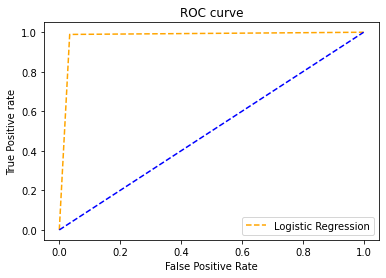

In [20]:
plt.plot(fpr1, tpr1, linestyle='--',color='orange', label='Logistic Regression')
plt.plot(p_fpr, p_tpr, linestyle='--', color='blue')
plt.title('ROC curve')
# x label
plt.xlabel('False Positive Rate')
# y label
plt.ylabel('True Positive rate')
plt.legend(loc='best')
plt.show();

In [21]:
train_df = pd.read_csv('train_evals.csv')
train_df.head()

,Dice,IOU,PCC_score,Pixel acc,Run_date,SSIM,SSIM_std,description,euclidean_dist,euclidean_std,fqm_absolute,fqm_balanced,fqm_correlation,fqm_std,model_num,mse,mse_std,pcc_std,Run_ID
0,NaN,NaN,0.90,NaN,2021-01-13,0.90,0.08,\n REGULAR BRIGHT DARK\nPREPROCESSIN...,40.95,26.89,1126.76,-410.07,0.9770,2288.30,-1,2381.22,2604.69,0.09,NaN
1,NaN,NaN,0.91,NaN,2021-01-14,0.91,0.08,\n REGULAR BRIGHT DARK\nPREPROCESSIN...,39.07,25.82,1095.84,220.63,0.9788,2156.41,-1,2175.73,2446.32,0.08,NaN
2,NaN,NaN,0.90,NaN,2021-01-11 00:00:00,0.91,0.08,\n REGULAR BRIGHT DARK\nPREPROCESSIN...,40.12,26.12,1109.60,-439.10,0.9784,2198.99,-1,2273.73,2388.59,0.08,NaN
3,NaN,NaN,0.91,NaN,2021-01-17 00:00:00,0.91,0.08,REGULAR BRIGHT DARK\nPREPROCESSING: BRIGHTNESS...,38.43,25.79,971.70,-116.88,0.9767,2333.15,-1,2125.44,2536.37,0.08,NaN
4,NaN,NaN,0.90,NaN,2021-01-11 00:00:00,0.91,0.08,\n REGULAR BRIGHT DARK\nPREPROCESSIN...,38.89,26.22,1042.13,-170.53,0.9748,2411.36,-1,2182.55,2611.88,0.09,NaN


In [22]:
data = {'Run_date':  date_of_run,
        'PCC_score': [round(float(avg[0]), 2)],
        'pcc_std': [round(float(std[0]), 2)],
       'fqm_absolute': [round(diff / samples, 2)   ],
       'fqm_std': [round(std_errorcalc, 2)],
       'fqm_balanced': [round(diffr / samples, 2)],
       'fqm_correlation': [round(correlation, 4)],
       'euclidean_dist': [round(float(avg_dst[0]), 2)],
       'euclidean_std': [round(float(std_dst[0]), 2)],
       'mse': [round(float(np.mean(mses)), 2)],
       'mse_std': [round(float(np.std(mses)), 2)],
       'SSIM': [round(float(np.mean(mmsis)), 2)],
              'Pixel acc': [round(float(pix_acc_mean), 4)],
       'SSIM_std': [round(float(np.std(mmsis)), 2)],
                 'IOU': [round(float(miou), 4)],
          'Dice': [round(float(dice_mean), 4)],
       'description': [description
],
       'model_num': model_number}

In [23]:
df = pd.DataFrame(data)
df['Run_date'] = pd.to_datetime(df['Run_date'])
df

,Run_date,PCC_score,pcc_std,fqm_absolute,fqm_std,fqm_balanced,fqm_correlation,euclidean_dist,euclidean_std,mse,mse_std,SSIM,Pixel acc,SSIM_std,IOU,Dice,description,model_num
0,2021-06-30,0.95,0.06,504.76,3010.66,27.49,0.9756,25.31,17.81,1070.97,3027.71,0.95,0.9835,0.06,0.9357,0.9546,\ncut it\n,160


In [24]:
frames = [train_df, df]
result = pd.concat(frames)
result.tail()

,Dice,IOU,PCC_score,Pixel acc,Run_date,SSIM,SSIM_std,description,euclidean_dist,euclidean_std,fqm_absolute,fqm_balanced,fqm_correlation,fqm_std,model_num,mse,mse_std,pcc_std,Run_ID
188,0.9301,0.9034,0.93,0.9749,NaN,0.93,0.07,\nview notes\n,33.31,22.30,1006.01,694.84,0.9861,2217.66,140,1631.23,2322.97,0.08,test0212
189,0.7208,0.6673,0.71,0.8981,NaN,0.79,0.14,\nview notes\n,70.87,40.41,2903.93,-40.97,0.9452,3418.38,184,6622.92,4654.77,0.19,test0214
190,0.9547,0.9357,0.95,0.9835,2021-06-30 00:00:00,0.95,0.06,\ncut it\n,25.31,17.81,503.98,27.88,0.9756,3010.94,160,1071.29,3028.49,0.06,NaN
191,0.9659,0.9519,0.97,0.9870,NaN,0.96,0.05,\nview notes\n,22.20,15.67,409.92,-27.03,0.9774,2839.00,230,843.93,2835.75,0.05,test0224
0,0.9546,0.9357,0.95,0.9835,2021-06-30 00:00:00,0.95,0.06,\ncut it\n,25.31,17.81,504.76,27.49,0.9756,3010.66,160,1070.97,3027.71,0.06,NaN


In [25]:
result.to_csv('train_evals.csv', index=False)

## Test Data

In [34]:
def mse(imageA, imageB):
    # the 'Mean Squared Error' between the two images is the
    # sum of the squared difference between the two images;
    # NOTE: the two images must have the same dimension
    err = np.sum((imageA.astype("float") - imageB.astype("float")) ** 2)
    err /= float(imageA.shape[0] * imageA.shape[1])

    # return the MSE, the lower the error, the more "similar"
    # the two images are
    return err

data = load(test_file)
[A1, A2] = data['arr_0'], data['arr_1'] 
X1 = A1.astype(np.uint8)
X2 = A2.astype(np.uint8)
print('Loaded', X1.shape)

samples = X1.shape[0]


Loaded (173, 256, 256, 3)


In [35]:
l1 = []
l2 = []
corrs = []
stds = []
EDs = []
eustds = []
mses = []
mmsis = []
precision_list = []
recall_list = []
split_list = []
merge_list = []
error_list = []
pix_acc_list = []
iou_list = []
dice_list = []
curve_tar = []
curve_gen = []
pcc_sp = np.zeros((samples,1), dtype='float32')
ED = np.zeros((samples,1), dtype='float32')
dst = np.zeros((samples,1), dtype='float32')

  1%|          | 2/173 [00:01<01:40,  1.70it/s]

white 51229
black 14307
total 65536
white_tar 51580
white 65536
black 0
total 65536
white_tar 65536


  2%|▏         | 4/173 [00:01<00:49,  3.44it/s]

white 44960
black 20576
total 65536
white_tar 44672
white 33808
black 31728
total 65536
white_tar 30040


  3%|▎         | 6/173 [00:01<00:34,  4.87it/s]

white 31712
black 33824
total 65536
white_tar 34199
white 39259
black 26277
total 65536
white_tar 37433


  5%|▍         | 8/173 [00:02<00:26,  6.24it/s]

white 65536
black 0
total 65536
white_tar 65536
white 13035
black 52501
total 65536
white_tar 17394


  6%|▌         | 10/173 [00:02<00:23,  7.04it/s]

white 37955
black 27581
total 65536
white_tar 38161
white 59360
black 6176
total 65536
white_tar 59423


  6%|▋         | 11/173 [00:02<00:22,  7.35it/s]

white 39468
black 26068
total 65536
white_tar 30930
white 36097
black 29439
total 65536
white_tar 38657


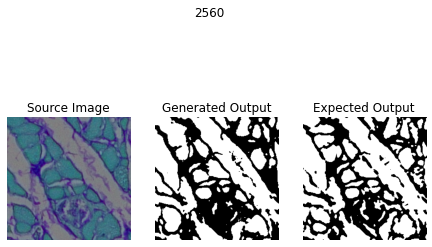

  8%|▊         | 14/173 [00:03<00:31,  5.09it/s]

white 48276
black 17260
total 65536
white_tar 48885
white 38878
black 26658
total 65536
white_tar 31509


  9%|▉         | 16/173 [00:03<00:26,  5.91it/s]

white 39842
black 25694
total 65536
white_tar 39836
white 40840
black 24696
total 65536
white_tar 42648


 10%|█         | 18/173 [00:03<00:22,  6.87it/s]

white 64188
black 1348
total 65536
white_tar 64220
white 35730
black 29806
total 65536
white_tar 31500


 12%|█▏        | 20/173 [00:04<00:20,  7.59it/s]

white 64167
black 1369
total 65536
white_tar 64140
white 28205
black 37331
total 65536
white_tar 32189


 13%|█▎        | 22/173 [00:04<00:18,  8.10it/s]

white 45474
black 20062
total 65536
white_tar 46554
white 41335
black 24201
total 65536
white_tar 40315


 14%|█▍        | 24/173 [00:04<00:17,  8.29it/s]

white 59154
black 6382
total 65536
white_tar 59175
white 65536
black 0
total 65536
white_tar 65536


 15%|█▌        | 26/173 [00:04<00:17,  8.60it/s]

white 51547
black 13989
total 65536
white_tar 51395
white 41485
black 24051
total 65536
white_tar 44051


 16%|█▌        | 28/173 [00:05<00:16,  8.89it/s]

white 64674
black 862
total 65536
white_tar 64690
white 42619
black 22917
total 65536
white_tar 41231


 17%|█▋        | 30/173 [00:05<00:15,  9.00it/s]

white 48839
black 16697
total 65536
white_tar 48962
white 50914
black 14622
total 65536
white_tar 50961


 18%|█▊        | 32/173 [00:05<00:16,  8.65it/s]

white 64975
black 561
total 65536
white_tar 65040
white 48724
black 16812
total 65536
white_tar 48706


 20%|█▉        | 34/173 [00:05<00:15,  8.73it/s]

white 63517
black 2019
total 65536
white_tar 63942
white 32433
black 33103
total 65536
white_tar 25609


 21%|██        | 36/173 [00:05<00:15,  8.66it/s]

white 37425
black 28111
total 65536
white_tar 38739
white 53831
black 11705
total 65536
white_tar 54320


 22%|██▏       | 38/173 [00:06<00:15,  8.65it/s]

white 31026
black 34510
total 65536
white_tar 22725
white 60109
black 5427
total 65536
white_tar 59837


 23%|██▎       | 40/173 [00:06<00:15,  8.64it/s]

white 46152
black 19384
total 65536
white_tar 50196
white 37900
black 27636
total 65536
white_tar 41411


 24%|██▍       | 42/173 [00:06<00:15,  8.57it/s]

white 37201
black 28335
total 65536
white_tar 43577
white 26365
black 39171
total 65536
white_tar 21885


 25%|██▌       | 44/173 [00:06<00:15,  8.48it/s]

white 25340
black 40196
total 65536
white_tar 13251
white 33241
black 32295
total 65536
white_tar 34627


 27%|██▋       | 46/173 [00:07<00:15,  8.40it/s]

white 65536
black 0
total 65536
white_tar 65536
white 26882
black 38654
total 65536
white_tar 26925


 28%|██▊       | 48/173 [00:07<00:14,  8.61it/s]

white 41064
black 24472
total 65536
white_tar 38471
white 54047
black 11489
total 65536
white_tar 55887


 29%|██▉       | 50/173 [00:07<00:14,  8.40it/s]

white 26264
black 39272
total 65536
white_tar 21510
white 57780
black 7756
total 65536
white_tar 54015


 30%|███       | 52/173 [00:07<00:14,  8.49it/s]

white 54289
black 11247
total 65536
white_tar 56165
white 29024
black 36512
total 65536
white_tar 27450


 31%|███       | 54/173 [00:08<00:14,  7.95it/s]

white 65536
black 0
total 65536
white_tar 65536
white 50172
black 15364
total 65536
white_tar 43650


 32%|███▏      | 56/173 [00:08<00:14,  8.22it/s]

white 60388
black 5148
total 65536
white_tar 59900
white 31971
black 33565
total 65536
white_tar 30996


 34%|███▎      | 58/173 [00:08<00:13,  8.48it/s]

white 41375
black 24161
total 65536
white_tar 41501
white 47288
black 18248
total 65536
white_tar 48276


 35%|███▍      | 60/173 [00:08<00:13,  8.65it/s]

white 38934
black 26602
total 65536
white_tar 40470
white 24727
black 40809
total 65536
white_tar 24056


 36%|███▌      | 62/173 [00:09<00:12,  8.80it/s]

white 61732
black 3804
total 65536
white_tar 61973
white 34074
black 31462
total 65536
white_tar 36502


 37%|███▋      | 64/173 [00:09<00:12,  8.71it/s]

white 53668
black 11868
total 65536
white_tar 55455
white 62753
black 2783
total 65536
white_tar 63071


 38%|███▊      | 66/173 [00:09<00:12,  8.73it/s]

white 46278
black 19258
total 65536
white_tar 48520
white 55007
black 10529
total 65536
white_tar 54373


 39%|███▉      | 68/173 [00:09<00:11,  8.85it/s]

white 40825
black 24711
total 65536
white_tar 38986
white 41865
black 23671
total 65536
white_tar 40825


 40%|████      | 70/173 [00:09<00:11,  8.76it/s]

white 60879
black 4657
total 65536
white_tar 62019
white 56764
black 8772
total 65536
white_tar 49538


 42%|████▏     | 72/173 [00:10<00:11,  8.44it/s]

white 32864
black 32672
total 65536
white_tar 36429
white 31728
black 33808
total 65536
white_tar 36825


 43%|████▎     | 74/173 [00:10<00:11,  8.60it/s]

white 65536
black 0
total 65536
white_tar 65536
white 45617
black 19919
total 65536
white_tar 45262


 44%|████▍     | 76/173 [00:10<00:11,  8.50it/s]

white 58093
black 7443
total 65536
white_tar 58616
white 45714
black 19822
total 65536
white_tar 46438


 45%|████▌     | 78/173 [00:10<00:11,  8.37it/s]

white 44639
black 20897
total 65536
white_tar 47377
white 39746
black 25790
total 65536
white_tar 41743


 46%|████▌     | 79/173 [00:11<00:11,  8.21it/s]

white 62751
black 2785
total 65536
white_tar 63446
white 62534
black 3002
total 65536
white_tar 62750


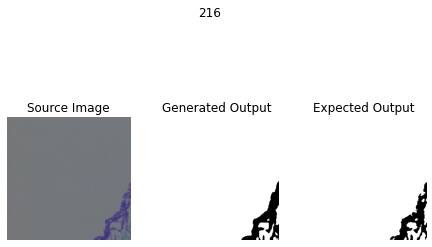

 47%|████▋     | 82/173 [00:11<00:15,  5.82it/s]

white 29307
black 36229
total 65536
white_tar 32290
white 23842
black 41694
total 65536
white_tar 27174


 49%|████▊     | 84/173 [00:11<00:12,  6.87it/s]

white 28548
black 36988
total 65536
white_tar 28220
white 42861
black 22675
total 65536
white_tar 43200


 49%|████▉     | 85/173 [00:12<00:12,  7.26it/s]

white 30237
black 35299
total 65536
white_tar 33535
white 46849
black 18687
total 65536
white_tar 40514


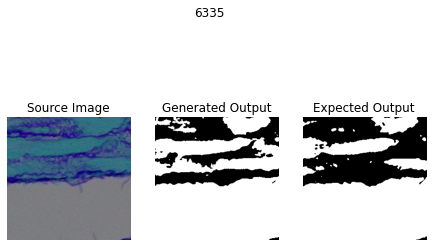

 51%|█████     | 88/173 [00:12<00:13,  6.19it/s]

white 40267
black 25269
total 65536
white_tar 44009
white 52301
black 13235
total 65536
white_tar 53392


 52%|█████▏    | 90/173 [00:12<00:11,  7.00it/s]

white 32107
black 33429
total 65536
white_tar 22901
white 56603
black 8933
total 65536
white_tar 56335


 53%|█████▎    | 92/173 [00:13<00:10,  7.75it/s]

white 21331
black 44205
total 65536
white_tar 15068
white 61283
black 4253
total 65536
white_tar 61016


 54%|█████▍    | 94/173 [00:13<00:09,  8.00it/s]

white 32386
black 33150
total 65536
white_tar 34926
white 43850
black 21686
total 65536
white_tar 44454


 55%|█████▌    | 96/173 [00:13<00:09,  8.25it/s]

white 62252
black 3284
total 65536
white_tar 52601
white 26379
black 39157
total 65536
white_tar 30872


 57%|█████▋    | 98/173 [00:13<00:09,  8.24it/s]

white 57003
black 8533
total 65536
white_tar 56750
white 63746
black 1790
total 65536
white_tar 63724


 58%|█████▊    | 100/173 [00:14<00:08,  8.38it/s]

white 51480
black 14056
total 65536
white_tar 51011
white 35929
black 29607
total 65536
white_tar 27325
white 38984
black 26552
total 65536
white_tar 42531


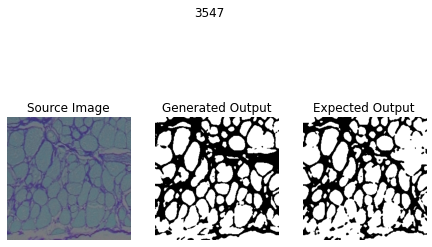

 58%|█████▊    | 101/173 [00:14<00:24,  2.98it/s]

white 55805
black 9731
total 65536
white_tar 56926


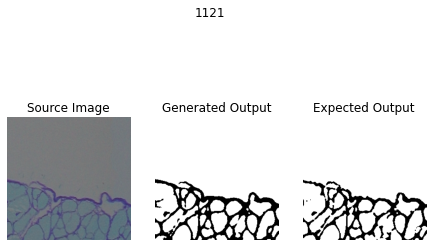

 60%|██████    | 104/173 [00:15<00:16,  4.13it/s]

white 60009
black 5527
total 65536
white_tar 62914
white 53841
black 11695
total 65536
white_tar 55797


 61%|██████    | 105/173 [00:15<00:14,  4.85it/s]

white 33426
black 32110
total 65536
white_tar 36365
white 28347
black 37189
total 65536
white_tar 19483


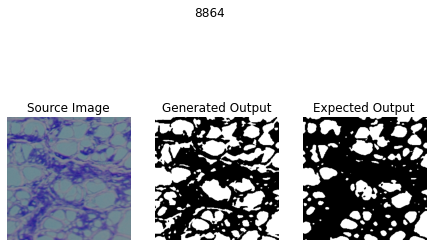

 62%|██████▏   | 108/173 [00:16<00:12,  5.23it/s]

white 38376
black 27160
total 65536
white_tar 42375
white 61293
black 4243
total 65536
white_tar 56179


 64%|██████▎   | 110/173 [00:16<00:09,  6.39it/s]

white 48565
black 16971
total 65536
white_tar 52461
white 59766
black 5770
total 65536
white_tar 56344


 65%|██████▍   | 112/173 [00:16<00:08,  7.30it/s]

white 44680
black 20856
total 65536
white_tar 44752
white 24049
black 41487
total 65536
white_tar 37379


 66%|██████▌   | 114/173 [00:17<00:07,  7.54it/s]

white 56404
black 9132
total 65536
white_tar 57554
white 42527
black 23009
total 65536
white_tar 44562


 67%|██████▋   | 116/173 [00:17<00:07,  7.86it/s]

white 51569
black 13967
total 65536
white_tar 51927
white 65536
black 0
total 65536
white_tar 65536
white 28854
black 36682
total 65536
white_tar 23760


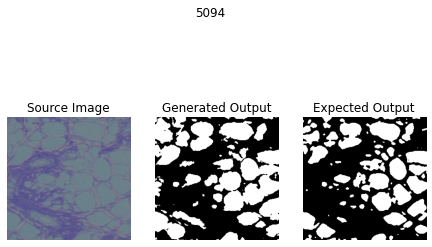

 69%|██████▉   | 119/173 [00:18<00:08,  6.20it/s]

white 44319
black 21217
total 65536
white_tar 44457
white 50409
black 15127
total 65536
white_tar 52136


 70%|██████▉   | 121/173 [00:18<00:07,  7.12it/s]

white 60288
black 5248
total 65536
white_tar 62167
white 51348
black 14188
total 65536
white_tar 52458


 71%|███████   | 123/173 [00:18<00:06,  7.78it/s]

white 50885
black 14651
total 65536
white_tar 53022
white 35184
black 30352
total 65536
white_tar 37973


 72%|███████▏  | 124/173 [00:18<00:06,  7.96it/s]

In [ ]:
#%%time
###
### Don't forget to change the test set and the run date
###

model = load_model(model_run, compile=False)
for l in tqdm(range(samples)):

    src_image, tar_image = X1[[l]], X2[[l]]
    invariant_generator = invariant_datagen.flow(
    src_image)
    invariant_generator.next()


    invariant =  invariant_generator[0].copy()

    src_image = invariant  
    var = src_image
    src_image = src_image[:, :, :, 0]

    
    
    
    gen_image = model.predict(src_image)
    
    tar_image = tar_image[:, :, :, 0]
    

    gen_image = (gen_image >= 0.5).astype(np.uint8)
    white = np.count_nonzero(gen_image == 1)
    black = (256 * 256) - white
    print('white', white)
    print('black', black)
    print('total', 256 * 256)
    white_tar = np.count_nonzero(tar_image == 255)
    print('white_tar', white_tar)
    black_tar = (256 * 256) - white_tar
    
  


    gen_calc = black
    true_calc = black_tar
    l1.append(gen_calc)
    l2.append(true_calc)
    
    num = random.randint(0, 100)
    if num > 95: 
        fig, ax = plt.subplots(nrows = 1, ncols = 3, figsize = (7.5, 5))
        fig.suptitle(f"{abs(black-black_tar)}")
        ax[0].set_title(f'Source Image')
        ax[0].imshow(var.astype(np.uint8).squeeze(), cmap='gray')
        ax[0].axis('off')
        ax[1].set_title('Generated Output')
        ax[1].imshow(gen_image.squeeze(), cmap='gray')
        ax[1].axis('off')
        ax[2].set_title('Expected Output')
        ax[2].imshow(tar_image.squeeze(), cmap='gray')
        ax[2].axis('off')
        plt.show()

    tp = 0
    tn = 0
    fp = 0
    fn = 0
    for i in range(tar_image.squeeze().shape[0]):
        #print('looping for', tar_image.squeeze().shape[0])
        gen_pix = gen_image.flatten()[i]
        tar_pix = tar_image.flatten()[i]

        if gen_pix == 0:
            if tar_pix == 0:

                tp += 1
            else:

                fp += 1
        elif gen_pix == 1:
            if tar_pix == 255:

                tn += 1
            else:

                fn += 1
    try:
        pix_acc = (tp + tn) / (tp + tn + fp + fn)

        iou = tp / (tp + fp + fn)
        dice = (2 * tp) / ((2 * tp) + fp + fn)
    except:
        pix_acc = 1
        iou = 1
    pix_acc_list.append(pix_acc)
    iou_list.append(iou)
    dice_list.append(dice)

In [ ]:
tp = 0
tn = 0
fp = 0
fn = 0
for i in range(tar_image.squeeze().shape[0]):
    #print('looping for', tar_image.squeeze().shape[0])
    gen_pix = gen_image.flatten()[i]
    tar_pix = tar_image.flatten()[i]

    if gen_pix == 0:
        if tar_pix == 0:

            tp += 1
        else:

            fp += 1
    elif gen_pix == 1:
        if tar_pix == 255:

            tn += 1
        else:

            fn += 1
try:
    pix_acc = (tp + tn) / (tp + tn + fp + fn)

    iou = tp / (tp + fp + fn)
    dice = (2 * tp) / ((2 * tp) + fp + fn)
except:
    pix_acc = 1
    iou = 1
pix_acc_list.append(pix_acc)
iou_list.append(iou)
dice_list.append(dice)


In [ ]:
iou_list

In [ ]:
avg_dst = np.average(dst, axis = 0)
std_dst = np.std(dst, axis = 0)

avg = np.average(pcc_sp, axis = 0)
std = np.std(pcc_sp, axis = 0)
pcc_score  = str(avg)
pcc_std = str(std)


diff = 0
diffuse = list()
for i in range(samples):
    diffuse.append(abs(l1[i] - l2[i]))
diff = np.sum(diffuse)
mean_errorcalc = np.mean(diffuse)
std_errorcalc = np.std(diffuse)
diffr = 0
for i in range(len(l1)):
    diffr += (l1[i] - l2[i])
correlation, p_value = stats.pearsonr(l1, l2)

pix_acc_mean = statistics.mean(pix_acc_list)
miou = statistics.mean(iou_list)
dice_mean = statistics.mean(dice_list)

print(f"PCC score: {round(float(avg[0]), 2)} with standard deviation {round(float(std[0]), 2)}.")
print(f"FQM absolute difference per sample: {round(diff / samples, 2)} with standard deviation {round(std_errorcalc, 2)}.\nFQM balanced difference per sample: {round(diffr / samples, 2)}.\nFQM correlation: {round(correlation, 4)}.")
print(f"Euclidean distance: {round(float(avg_dst[0]), 2)}, with std {round(float(std_dst[0]), 2)}")
print(f"MSE {round(float(np.mean(mses)), 2)}, with std {round(float(np.std(mses)), 2)}")
print(f"SSMI {round(float(np.mean(mmsis)), 2)}, with std {round(float(np.std(mmsis)), 2)}")
print('pix acc mean is ', pix_acc_mean)
print('miou is ', miou)

  1%|          | 2/173 [00:01<01:41,  1.69it/s]

white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0


  2%|▏         | 4/173 [00:01<00:46,  3.64it/s]

white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0


  3%|▎         | 6/173 [00:01<00:31,  5.38it/s]

white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0


  5%|▍         | 8/173 [00:02<00:24,  6.63it/s]

white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0


  6%|▌         | 10/173 [00:02<00:22,  7.40it/s]

white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0


  7%|▋         | 12/173 [00:02<00:21,  7.65it/s]

white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0


  8%|▊         | 14/173 [00:02<00:20,  7.88it/s]

white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0


  9%|▉         | 16/173 [00:03<00:19,  8.00it/s]

white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0


 10%|█         | 18/173 [00:03<00:19,  7.79it/s]

white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0


 12%|█▏        | 20/173 [00:03<00:18,  8.14it/s]

white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0


 13%|█▎        | 22/173 [00:03<00:18,  8.21it/s]

white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0


 14%|█▍        | 24/173 [00:04<00:17,  8.40it/s]

white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0


 15%|█▌        | 26/173 [00:04<00:18,  8.15it/s]

white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0


 16%|█▌        | 28/173 [00:04<00:17,  8.07it/s]

white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0


 17%|█▋        | 30/173 [00:04<00:17,  8.14it/s]

white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0


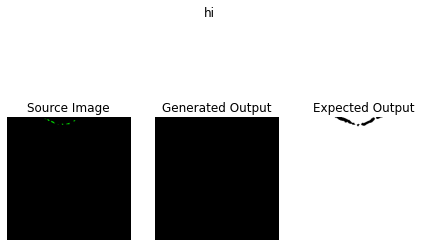

 19%|█▉        | 33/173 [00:05<00:25,  5.42it/s]

white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0


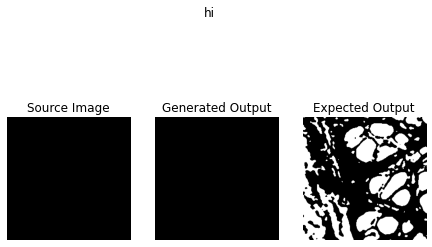

 21%|██        | 36/173 [00:06<00:24,  5.65it/s]

white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0


 22%|██▏       | 38/173 [00:06<00:20,  6.61it/s]

white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0


 23%|██▎       | 40/173 [00:06<00:17,  7.47it/s]

white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0


 24%|██▍       | 42/173 [00:06<00:16,  7.90it/s]

white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0


 25%|██▌       | 44/173 [00:07<00:16,  8.02it/s]

white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0


 27%|██▋       | 46/173 [00:07<00:16,  7.93it/s]

white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0


 28%|██▊       | 48/173 [00:07<00:15,  8.02it/s]

white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0


 29%|██▉       | 50/173 [00:07<00:14,  8.23it/s]

white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0


 30%|███       | 52/173 [00:08<00:14,  8.41it/s]

white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0


 31%|███       | 54/173 [00:08<00:14,  8.44it/s]

white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0


 32%|███▏      | 56/173 [00:08<00:13,  8.50it/s]

white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0


 33%|███▎      | 57/173 [00:08<00:13,  8.36it/s]

white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0


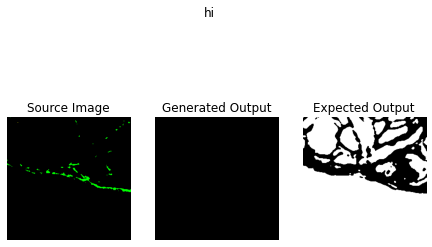

 35%|███▍      | 60/173 [00:09<00:17,  6.45it/s]

white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0


 36%|███▌      | 62/173 [00:09<00:15,  7.25it/s]

white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0


 37%|███▋      | 64/173 [00:09<00:14,  7.72it/s]

white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0


 38%|███▊      | 66/173 [00:10<00:12,  8.28it/s]

white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0


 39%|███▉      | 68/173 [00:10<00:12,  8.51it/s]

white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0


 40%|████      | 70/173 [00:10<00:12,  8.57it/s]

white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0


 42%|████▏     | 72/173 [00:10<00:11,  8.68it/s]

white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0


 43%|████▎     | 74/173 [00:10<00:11,  8.72it/s]

white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0


 44%|████▍     | 76/173 [00:11<00:10,  8.87it/s]

white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0


 45%|████▌     | 78/173 [00:11<00:10,  8.81it/s]

white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0


 46%|████▌     | 80/173 [00:11<00:10,  8.88it/s]

white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0


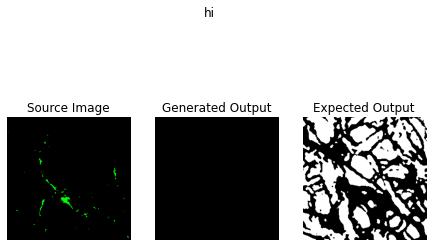

 48%|████▊     | 83/173 [00:12<00:13,  6.77it/s]

white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0


 49%|████▉     | 85/173 [00:12<00:11,  7.55it/s]

white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0


 50%|█████     | 87/173 [00:12<00:10,  8.07it/s]

white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0


 51%|█████▏    | 89/173 [00:12<00:10,  8.25it/s]

white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0


 53%|█████▎    | 91/173 [00:13<00:09,  8.66it/s]

white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0


 54%|█████▍    | 93/173 [00:13<00:09,  8.65it/s]

white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0


 55%|█████▍    | 95/173 [00:13<00:09,  8.50it/s]

white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0


 56%|█████▌    | 97/173 [00:13<00:08,  8.49it/s]

white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0


 57%|█████▋    | 99/173 [00:14<00:08,  8.64it/s]

white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0


 58%|█████▊    | 101/173 [00:14<00:08,  8.61it/s]

white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0


 60%|█████▉    | 103/173 [00:14<00:08,  8.62it/s]

white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0


 61%|██████    | 105/173 [00:14<00:07,  8.72it/s]

white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0


 62%|██████▏   | 107/173 [00:14<00:07,  8.94it/s]

white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0


 63%|██████▎   | 109/173 [00:15<00:13,  4.61it/s]

white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0


 64%|██████▍   | 111/173 [00:15<00:10,  5.97it/s]

white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0


 65%|██████▌   | 113/173 [00:16<00:08,  7.15it/s]

white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0


 66%|██████▋   | 115/173 [00:16<00:07,  7.85it/s]

white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0


 68%|██████▊   | 117/173 [00:16<00:06,  8.34it/s]

white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0


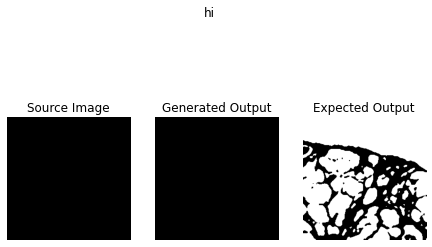

 69%|██████▉   | 120/173 [00:17<00:08,  6.54it/s]

white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0


 71%|███████   | 122/173 [00:17<00:06,  7.50it/s]

white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0


 72%|███████▏  | 124/173 [00:17<00:06,  8.12it/s]

white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0


 73%|███████▎  | 126/173 [00:17<00:05,  8.16it/s]

white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0


 74%|███████▍  | 128/173 [00:18<00:05,  8.54it/s]

white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0


 75%|███████▌  | 130/173 [00:18<00:04,  8.62it/s]

white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0


 76%|███████▋  | 132/173 [00:18<00:04,  8.77it/s]

white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0


 77%|███████▋  | 134/173 [00:18<00:04,  8.79it/s]

white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0


 79%|███████▊  | 136/173 [00:19<00:04,  8.95it/s]

white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0


 80%|███████▉  | 138/173 [00:19<00:03,  8.97it/s]

white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0


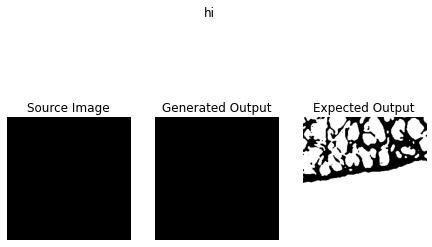

 82%|████████▏ | 141/173 [00:19<00:04,  6.93it/s]

white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0


 83%|████████▎ | 143/173 [00:20<00:03,  7.83it/s]

white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0


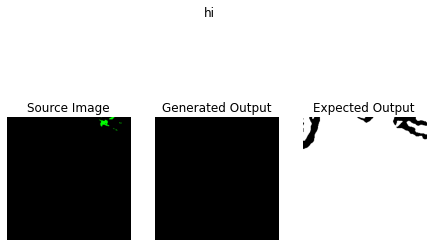

 84%|████████▍ | 146/173 [00:20<00:04,  6.64it/s]

white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0


 86%|████████▌ | 148/173 [00:20<00:03,  7.36it/s]

white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0


 87%|████████▋ | 150/173 [00:21<00:02,  7.72it/s]

white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0


 88%|████████▊ | 152/173 [00:21<00:02,  8.15it/s]

white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0


 89%|████████▉ | 154/173 [00:21<00:02,  8.38it/s]

white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0


 90%|█████████ | 156/173 [00:21<00:01,  8.67it/s]

white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0


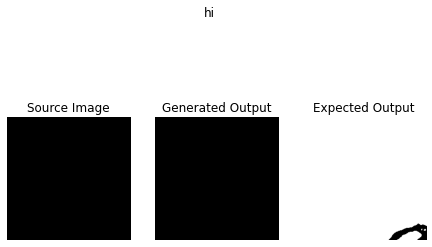

 92%|█████████▏| 159/173 [00:22<00:02,  6.73it/s]

white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0


 93%|█████████▎| 161/173 [00:22<00:01,  7.61it/s]

white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0


 94%|█████████▍| 163/173 [00:22<00:01,  8.24it/s]

white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0


 95%|█████████▌| 165/173 [00:23<00:00,  8.18it/s]

white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0


 97%|█████████▋| 167/173 [00:23<00:00,  8.63it/s]

white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0


 98%|█████████▊| 169/173 [00:23<00:00,  8.73it/s]

white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0


 99%|█████████▉| 171/173 [00:23<00:00,  8.89it/s]

white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0


100%|██████████| 173/173 [00:23<00:00,  7.22it/s]

white 0
black 65536
total 65536
white_tar 0
white 0
black 65536
total 65536
white_tar 0


In [19]:
#%%time
###
### Don't forget to change the test set and the run date
###

model = load_model(model_run, compile=False)
for l in tqdm(range(samples)):

    src_image, tar_image = X1[[l]], X2[[l]]
    invariant_generator = invariant_datagen.flow(
    src_image)
    invariant_generator.next()


    invariant =  invariant_generator[0].copy()

    src_image = invariant  
    var = src_image
    src_image = src_image[:, :, :, 0]

    
    
    
    gen_image = model.predict(src_image)
    
    tar_image = tar_image[:, :, :, 0]
    

    gen_image = (gen_image >= 0.5).astype(np.uint8)
    white = np.count_nonzero(gen_image == 1)
    black = (256 * 256) - white
    print('white', white)
    print('black', black)
    print('total', 256 * 256)
    white_tar = np.count_nonzero(tar_image == 255)
    print('white_tar', white_tar)
    black_tar = (256 * 256) - white_tar
    
  


    gen_calc = black
    true_calc = black_tar
    l1.append(gen_calc)
    l2.append(true_calc)
    
    num = random.randint(0, 100)
    if num > 95: 
        fig, ax = plt.subplots(nrows = 1, ncols = 3, figsize = (7.5, 5))
        fig.suptitle(f"hi")
        ax[0].set_title(f'Source Image')
        ax[0].imshow(var.astype(np.uint8).squeeze(), cmap='gray')
        ax[0].axis('off')
        ax[1].set_title('Generated Output')
        ax[1].imshow(gen_image.squeeze(), cmap='gray')
        ax[1].axis('off')
        ax[2].set_title('Expected Output')
        ax[2].imshow(tar_image.squeeze(), cmap='gray')
        ax[2].axis('off')
        plt.show()

    tp = 0
    tn = 0
    fp = 0
    fn = 0
    for i in range(tar_image.squeeze().shape[0]):
        #print('looping for', tar_image.squeeze().shape[0])
        gen_pix = gen_image.flatten()[i]
        tar_pix = tar_image.flatten()[i]

        if gen_pix == 0:
            if tar_pix == 0:

                tp += 1
            else:

                fp += 1
        elif gen_pix == 1:
            if tar_pix == 255:

                tn += 1
            else:

                fn += 1
    try:
        pix_acc = (tp + tn) / (tp + tn + fp + fn)

        iou = tp / (tp + fp + fn)
        dice = (2 * tp) / ((2 * tp) + fp + fn)
    except:
        pix_acc = 1
        iou = 1
    pix_acc_list.append(pix_acc)
    iou_list.append(iou)
    dice_list.append(dice)

In [ ]:
avg_dst = np.average(dst, axis = 0)
std_dst = np.std(dst, axis = 0)

avg = np.average(pcc_sp, axis = 0)
std = np.std(pcc_sp, axis = 0)
pcc_score  = str(avg)
pcc_std = str(std)


diff = 0
diffuse = list()
for i in range(samples):
    diffuse.append(abs(l1[i] - l2[i]))
diff = np.sum(diffuse)
mean_errorcalc = np.mean(diffuse)
std_errorcalc = np.std(diffuse)
diffr = 0
for i in range(len(l1)):
    diffr += (l1[i] - l2[i])
correlation, p_value = stats.pearsonr(l1, l2)

pix_acc_mean = statistics.mean(pix_acc_list)
miou = statistics.mean(iou_list)
dice_mean = statistics.mean(dice_list)

print(f"PCC score: {round(float(avg[0]), 2)} with standard deviation {round(float(std[0]), 2)}.")
print(f"FQM absolute difference per sample: {round(diff / samples, 2)} with standard deviation {round(std_errorcalc, 2)}.\nFQM balanced difference per sample: {round(diffr / samples, 2)}.\nFQM correlation: {round(correlation, 4)}.")
print(f"Euclidean distance: {round(float(avg_dst[0]), 2)}, with std {round(float(std_dst[0]), 2)}")
print(f"MSE {round(float(np.mean(mses)), 2)}, with std {round(float(np.std(mses)), 2)}")
print(f"SSMI {round(float(np.mean(mmsis)), 2)}, with std {round(float(np.std(mmsis)), 2)}")
print('pix acc mean is ', pix_acc_mean)
print('miou is ', miou)

  0%|          | 0/195 [00:00<?, ?it/s]

Gen_calc is 8116
True calc is 7806


/project/6003019/sergei/test2/lib/python3.7/site-packages/ipykernel_launcher.py:59: UserWarning: DEPRECATED: skimage.measure.compare_ssim has been moved to skimage.metrics.structural_similarity. It will be removed from skimage.measure in version 0.18.


0


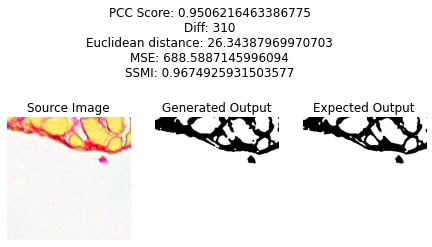

  1%|          | 1/195 [00:06<22:33,  6.98s/it]

Gen_calc is 3813
True calc is 3980
1


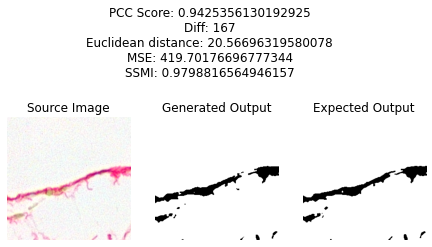

  1%|          | 2/195 [00:10<16:39,  5.18s/it]

Gen_calc is 42523
True calc is 43108
2


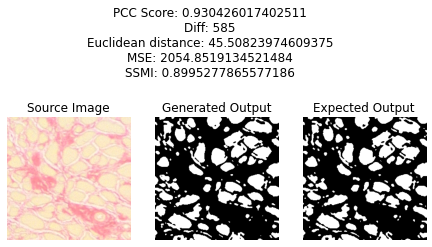

  2%|▏         | 3/195 [00:14<14:52,  4.65s/it]

Gen_calc is 9168
True calc is 10024
3


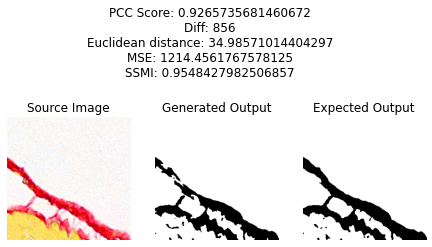

  2%|▏         | 4/195 [00:18<13:52,  4.36s/it]

Gen_calc is 17319
True calc is 18838
4


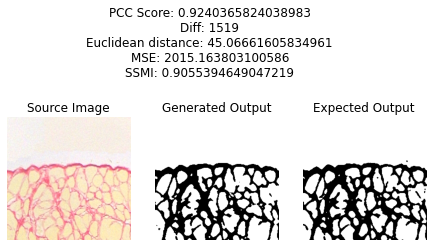

  3%|▎         | 5/195 [00:22<13:23,  4.23s/it]

Gen_calc is 25442
True calc is 23981
5


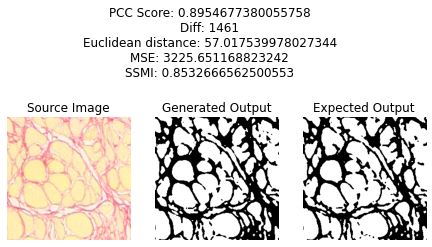

  3%|▎         | 6/195 [00:26<13:05,  4.16s/it]

Gen_calc is 39839
True calc is 39927
6


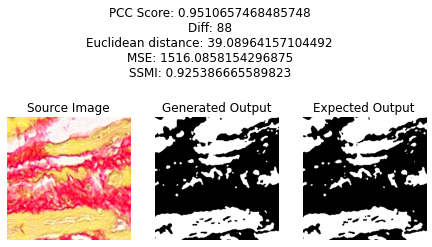

  4%|▎         | 7/195 [00:31<13:14,  4.23s/it]

Gen_calc is 7964
True calc is 7874
7


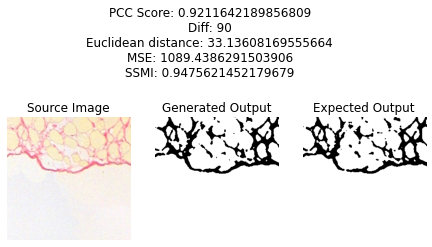

  4%|▍         | 8/195 [00:35<12:59,  4.17s/it]

Gen_calc is 19
True calc is 0


/project/6003019/sergei/test2/lib/python3.7/site-packages/ipykernel_launcher.py:53: RuntimeWarning: invalid value encountered in true_divide
/project/6003019/sergei/test2/lib/python3.7/site-packages/skimage/metrics/_structural_similarity.py:108: UserWarning: Inputs have mismatched dtype.  Setting data_range based on im1.dtype.
  im2[..., ch], **args)
/project/6003019/sergei/test2/lib/python3.7/site-packages/scipy/stats/stats.py:3508: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())


8


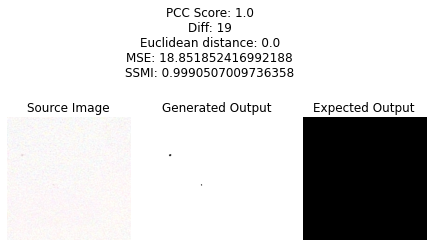

  5%|▍         | 9/195 [00:45<18:38,  6.01s/it]

Gen_calc is 0
True calc is 0


/project/6003019/sergei/test2/lib/python3.7/site-packages/ipykernel_launcher.py:52: RuntimeWarning: invalid value encountered in true_divide


9


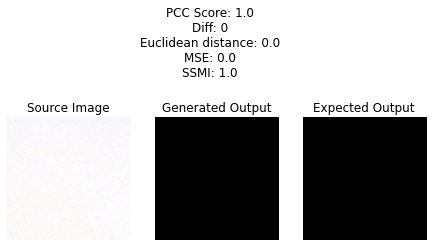

  5%|▌         | 10/195 [00:58<25:39,  8.32s/it]

Gen_calc is 0
True calc is 0
10


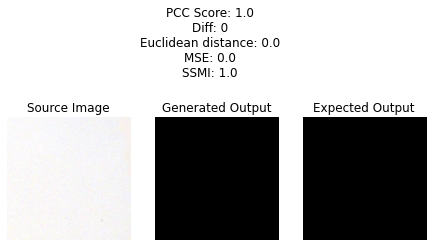

  6%|▌         | 11/195 [01:11<29:34,  9.64s/it]

Gen_calc is 31256
True calc is 31186
11


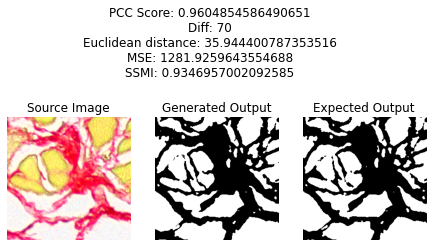

  6%|▌         | 12/195 [01:15<24:26,  8.01s/it]

Gen_calc is 13239
True calc is 12285
12


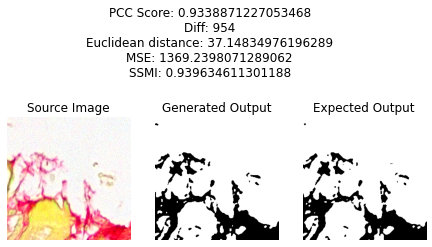

  7%|▋         | 13/195 [01:19<20:48,  6.86s/it]

Gen_calc is 34030
True calc is 34736
13


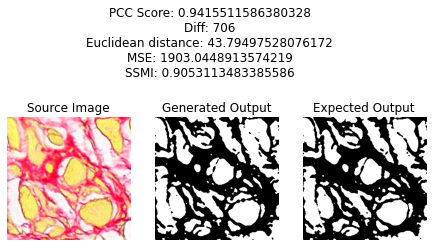

  7%|▋         | 14/195 [01:24<18:22,  6.09s/it]

Gen_calc is 27
True calc is 0
14


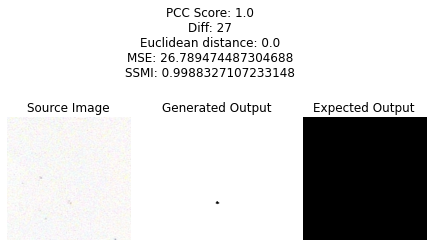

  8%|▊         | 15/195 [01:34<21:45,  7.25s/it]

Gen_calc is 19521
True calc is 21760
15


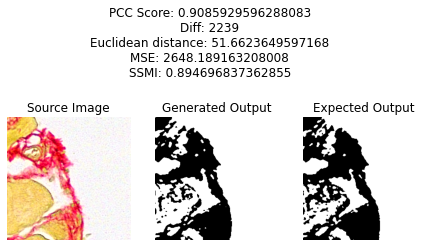

  8%|▊         | 16/195 [01:38<18:40,  6.26s/it]

Gen_calc is 0
True calc is 0
16


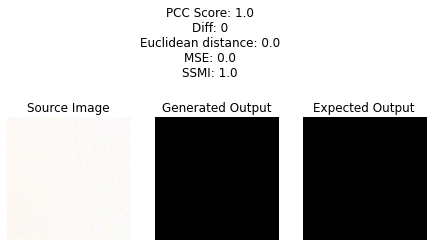

  9%|▊         | 17/195 [01:51<24:34,  8.29s/it]

Gen_calc is 30149
True calc is 30103
17


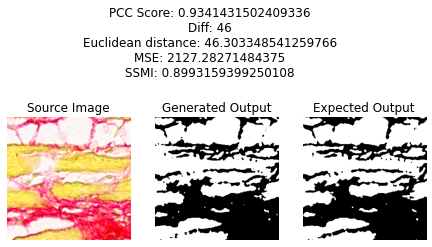

  9%|▉         | 18/195 [01:55<20:51,  7.07s/it]

Gen_calc is 16155
True calc is 17448
18


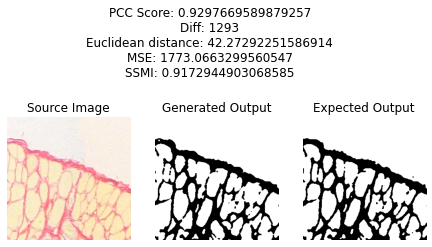

 10%|▉         | 19/195 [01:59<18:10,  6.20s/it]

Gen_calc is 4
True calc is 12
19


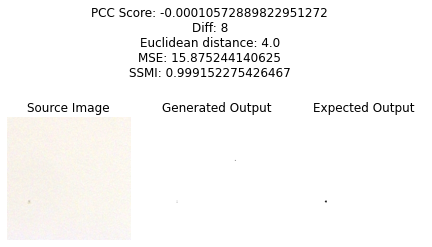

 10%|█         | 20/195 [02:03<16:16,  5.58s/it]

Gen_calc is 25693
True calc is 29209
20


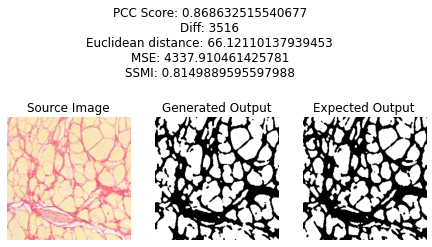

 11%|█         | 21/195 [02:09<16:31,  5.70s/it]

Gen_calc is 26365
True calc is 23793
21


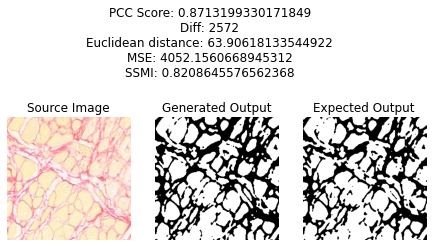

 11%|█▏        | 22/195 [02:13<14:55,  5.18s/it]

Gen_calc is 14312
True calc is 13991
22


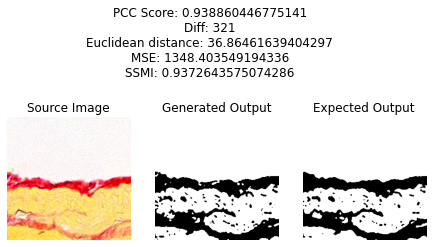

 12%|█▏        | 23/195 [02:17<13:47,  4.81s/it]

Gen_calc is 11546
True calc is 10823
23


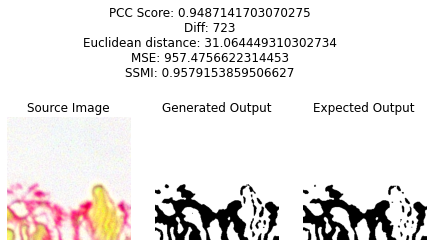

 12%|█▏        | 24/195 [02:21<12:59,  4.56s/it]

Gen_calc is 22
True calc is 20
24


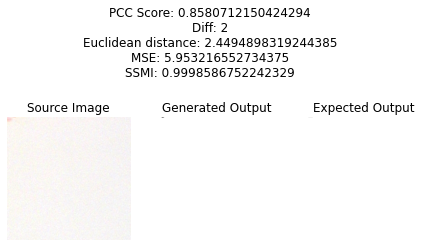

 13%|█▎        | 25/195 [02:25<12:29,  4.41s/it]

Gen_calc is 9591
True calc is 11167
25


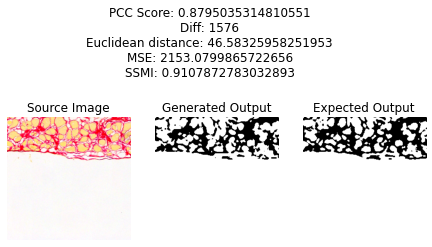

 13%|█▎        | 26/195 [02:29<12:03,  4.28s/it]

Gen_calc is 16867
True calc is 17188
26


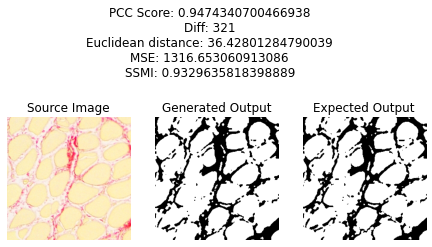

 14%|█▍        | 27/195 [02:33<11:51,  4.23s/it]

Gen_calc is 6510
True calc is 6599
27


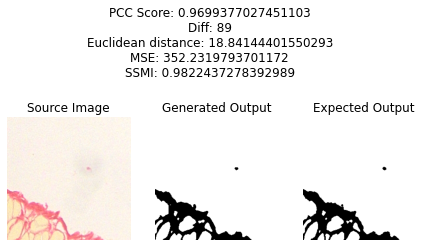

 14%|█▍        | 28/195 [02:37<11:42,  4.21s/it]

Gen_calc is 10699
True calc is 12236
28


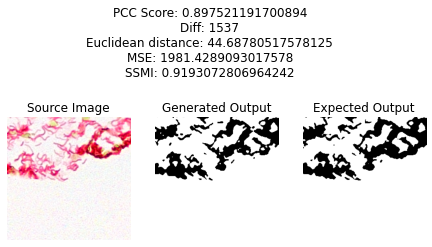

 15%|█▍        | 29/195 [02:41<11:23,  4.12s/it]

Gen_calc is 8860
True calc is 9193
29


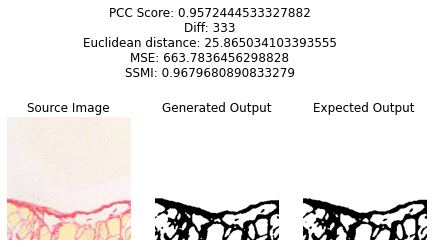

 15%|█▌        | 30/195 [02:46<11:32,  4.20s/it]

Gen_calc is 9269
True calc is 7003
30


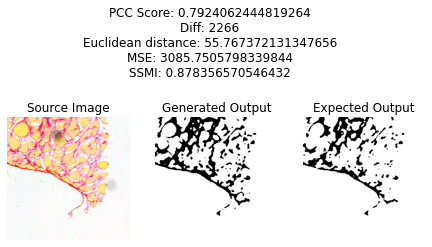

 16%|█▌        | 31/195 [02:50<11:19,  4.14s/it]

Gen_calc is 28035
True calc is 26262
31


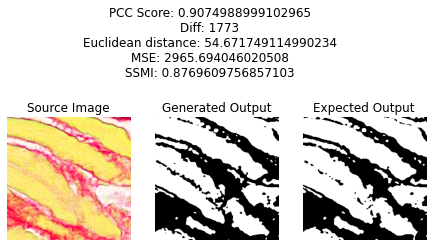

 16%|█▋        | 32/195 [02:54<11:09,  4.11s/it]

Gen_calc is 239
True calc is 255
32


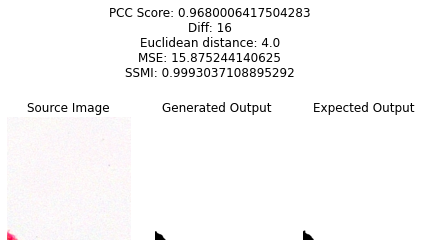

 17%|█▋        | 33/195 [02:58<10:54,  4.04s/it]

Gen_calc is 30080
True calc is 29482
33


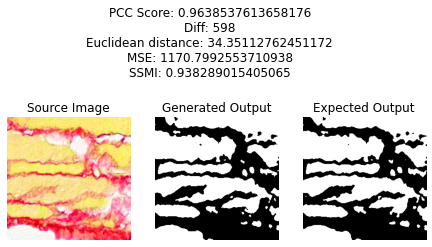

 17%|█▋        | 34/195 [03:03<11:37,  4.33s/it]

Gen_calc is 36545
True calc is 38817
34


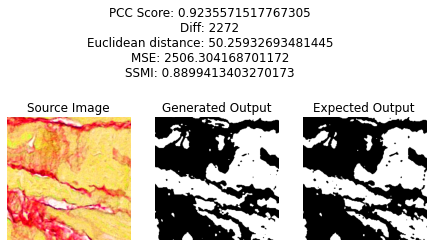

 18%|█▊        | 35/195 [03:07<11:20,  4.25s/it]

Gen_calc is 0
True calc is 0
35


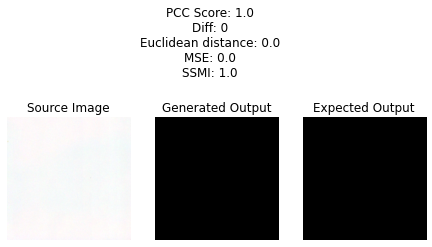

 18%|█▊        | 36/195 [03:20<18:09,  6.85s/it]

Gen_calc is 10907
True calc is 10663
36


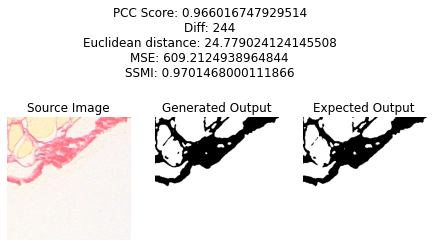

 19%|█▉        | 37/195 [03:24<16:01,  6.08s/it]

Gen_calc is 18271
True calc is 17506
37


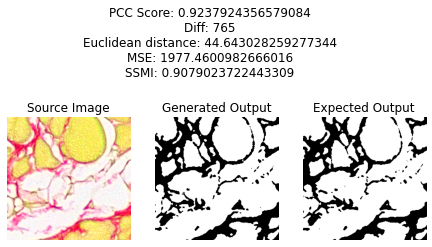

 19%|█▉        | 38/195 [03:28<14:29,  5.54s/it]

Gen_calc is 30155
True calc is 30790
38


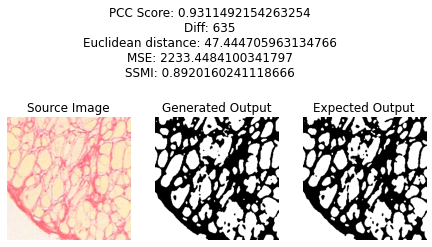

 20%|██        | 39/195 [03:32<13:12,  5.08s/it]

Gen_calc is 25061
True calc is 25110
39


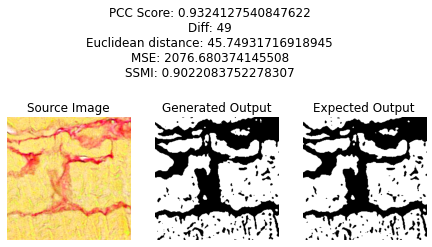

 21%|██        | 40/195 [03:36<12:18,  4.76s/it]

Gen_calc is 0
True calc is 0
40


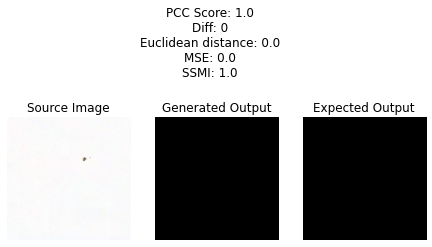

 21%|██        | 41/195 [03:49<18:35,  7.24s/it]

Gen_calc is 4295
True calc is 4588
41


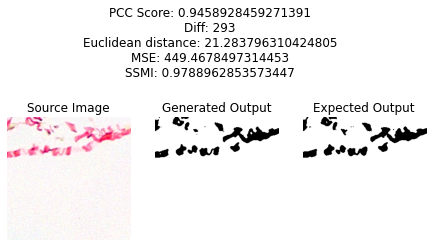

 22%|██▏       | 42/195 [03:54<16:45,  6.57s/it]

Gen_calc is 0
True calc is 0
42


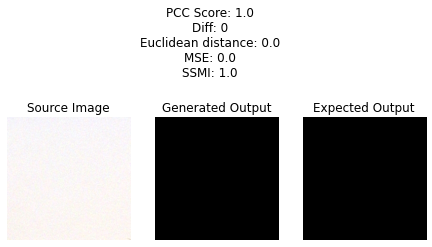

 22%|██▏       | 43/195 [04:07<21:42,  8.57s/it]

Gen_calc is 3
True calc is 6
43


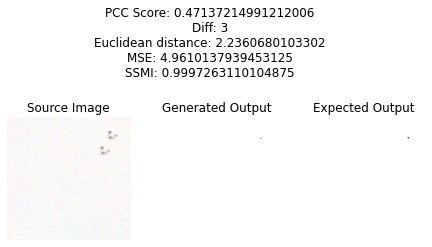

 23%|██▎       | 44/195 [04:12<18:24,  7.31s/it]

Gen_calc is 11399
True calc is 11301
44


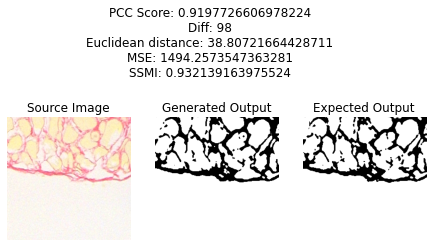

 23%|██▎       | 45/195 [04:16<15:50,  6.34s/it]

Gen_calc is 24722
True calc is 24686
45


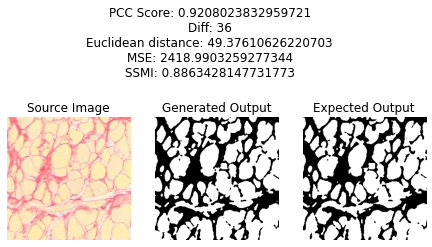

 24%|██▎       | 46/195 [04:20<13:58,  5.63s/it]

Gen_calc is 36559
True calc is 35435
46


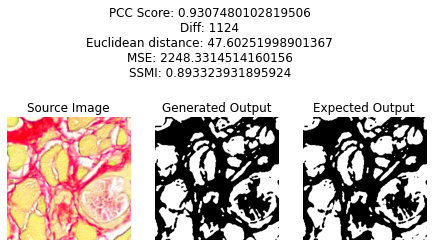

 24%|██▍       | 47/195 [04:25<13:47,  5.59s/it]

Gen_calc is 18073
True calc is 21555
47


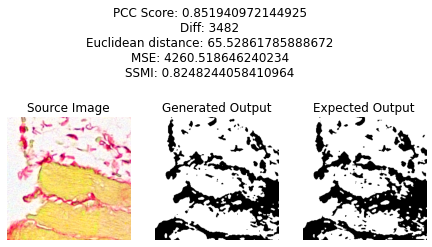

 25%|██▍       | 48/195 [04:30<12:49,  5.23s/it]

Gen_calc is 20
True calc is 0
48


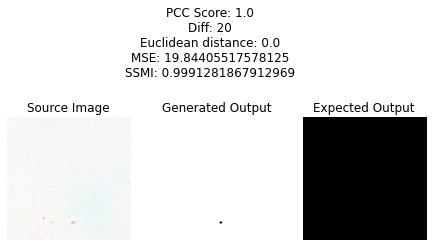

 25%|██▌       | 49/195 [04:39<15:56,  6.55s/it]

Gen_calc is 49358
True calc is 48939
49


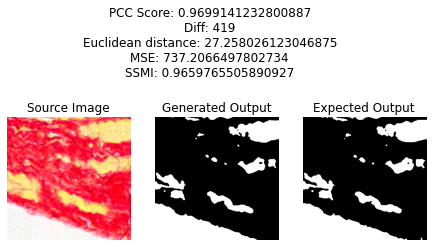

 26%|██▌       | 50/195 [04:44<14:10,  5.86s/it]

Gen_calc is 10
True calc is 0
50


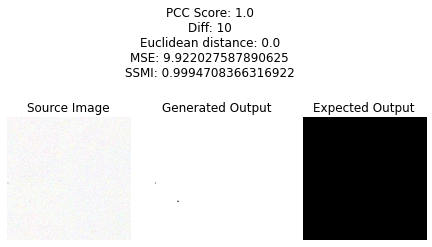

 26%|██▌       | 51/195 [04:53<16:47,  6.99s/it]

Gen_calc is 9158
True calc is 8872
51


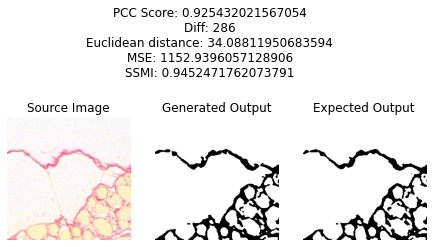

 27%|██▋       | 52/195 [04:57<14:36,  6.13s/it]

Gen_calc is 6214
True calc is 6952
52


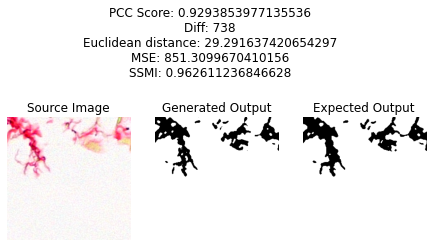

 27%|██▋       | 53/195 [05:01<12:57,  5.48s/it]

Gen_calc is 10816
True calc is 11239
53


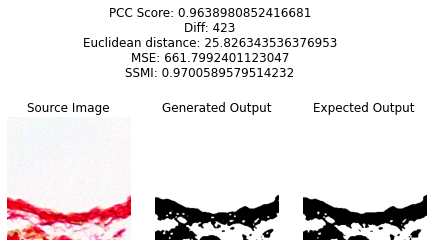

 28%|██▊       | 54/195 [05:05<11:53,  5.06s/it]

Gen_calc is 9223
True calc is 11109
54


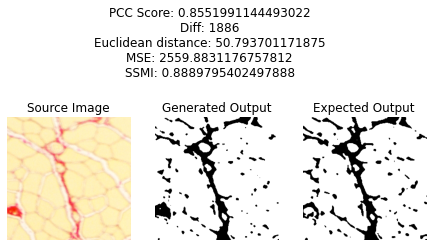

 28%|██▊       | 55/195 [05:10<11:19,  4.85s/it]

Gen_calc is 19134
True calc is 19761
55


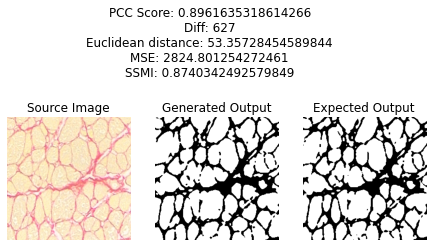

 29%|██▊       | 56/195 [05:14<10:40,  4.61s/it]

Gen_calc is 27710
True calc is 29113
56


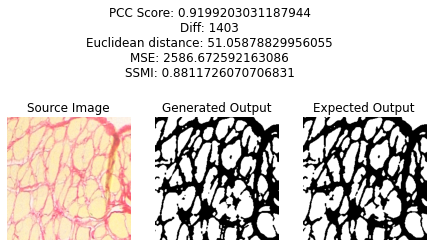

 29%|██▉       | 57/195 [05:18<10:13,  4.45s/it]

Gen_calc is 231
True calc is 222
57


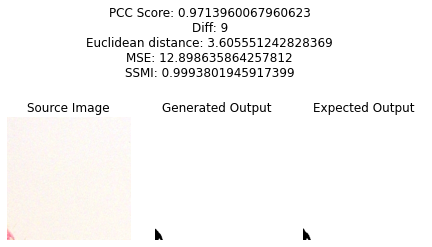

 30%|██▉       | 58/195 [05:22<09:54,  4.34s/it]

Gen_calc is 16720
True calc is 16966
58


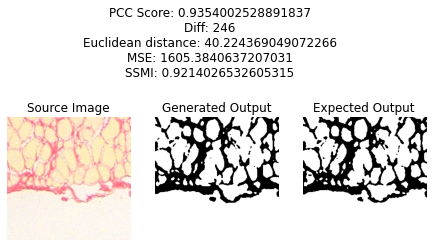

 30%|███       | 59/195 [05:26<09:56,  4.38s/it]

Gen_calc is 26365
True calc is 28076
59


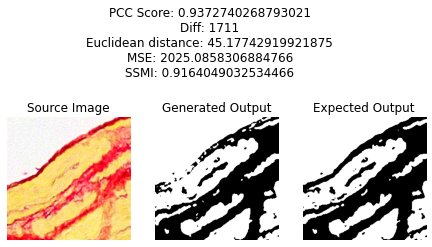

 31%|███       | 60/195 [05:32<10:27,  4.64s/it]

Gen_calc is 3013
True calc is 3267
60


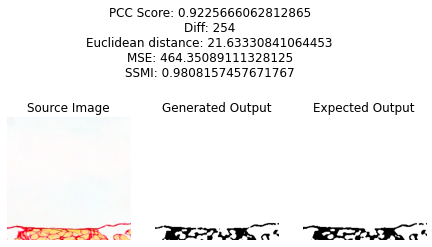

 31%|███▏      | 61/195 [05:36<09:58,  4.47s/it]

Gen_calc is 245
True calc is 221
61


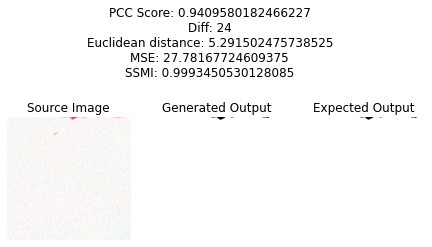

 32%|███▏      | 62/195 [05:40<09:31,  4.30s/it]

Gen_calc is 14903
True calc is 15023
62


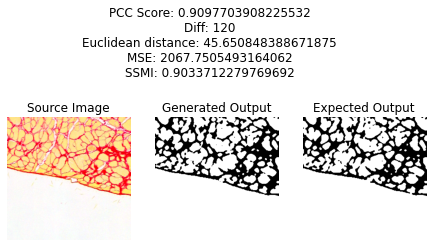

 32%|███▏      | 63/195 [05:44<09:16,  4.22s/it]

Gen_calc is 37555
True calc is 37145
63


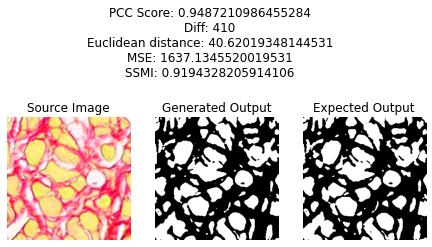

 33%|███▎      | 64/195 [05:48<09:22,  4.29s/it]

Gen_calc is 17304
True calc is 17479
64


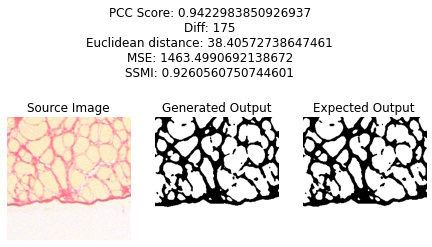

 33%|███▎      | 65/195 [05:52<09:09,  4.23s/it]

Gen_calc is 15208
True calc is 16098
65


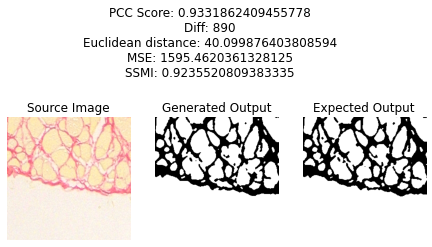

 34%|███▍      | 66/195 [05:56<08:58,  4.18s/it]

Gen_calc is 127
True calc is 171
66


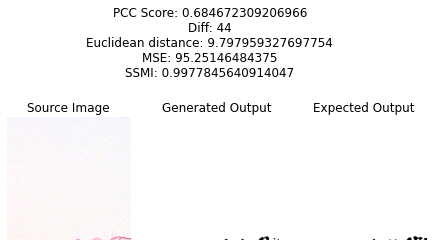

 34%|███▍      | 67/195 [06:00<08:50,  4.14s/it]

Gen_calc is 0
True calc is 0
67


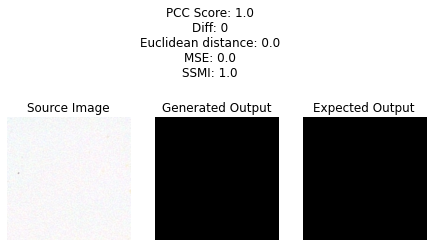

 35%|███▍      | 68/195 [06:13<14:16,  6.74s/it]

Gen_calc is 8
True calc is 0
68


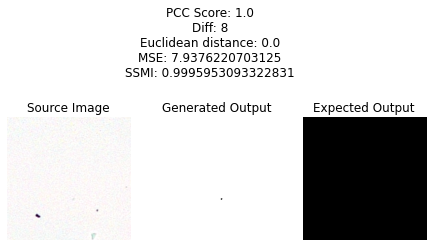

 35%|███▌      | 69/195 [06:23<16:19,  7.78s/it]

Gen_calc is 6
True calc is 0
69


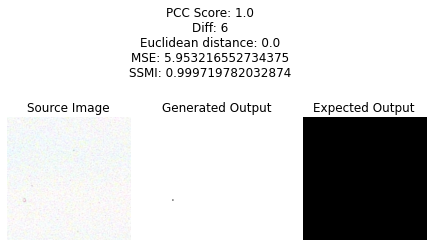

 36%|███▌      | 70/195 [06:33<17:37,  8.46s/it]

Gen_calc is 16188
True calc is 16156
70


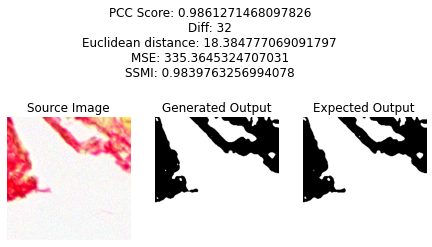

 36%|███▋      | 71/195 [06:38<14:49,  7.18s/it]

Gen_calc is 9779
True calc is 21127
71


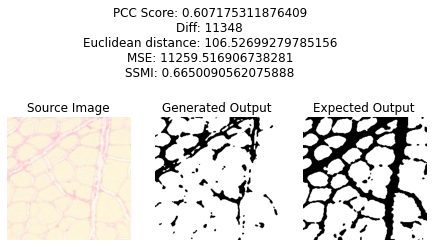

 37%|███▋      | 72/195 [06:42<12:47,  6.24s/it]

Gen_calc is 0
True calc is 0


 37%|███▋      | 73/195 [06:56<17:23,  8.55s/it]

Gen_calc is 13368
True calc is 13483
73


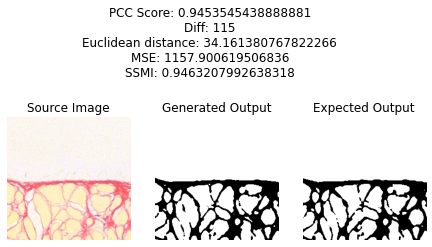

 38%|███▊      | 74/195 [07:00<14:51,  7.37s/it]

Gen_calc is 65536
True calc is 0
74


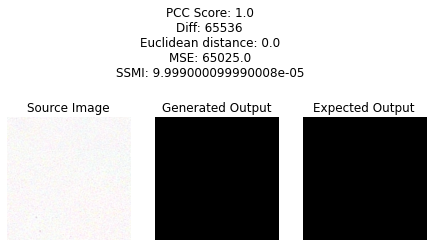

 38%|███▊      | 75/195 [07:10<16:15,  8.13s/it]

Gen_calc is 8307
True calc is 9827
75


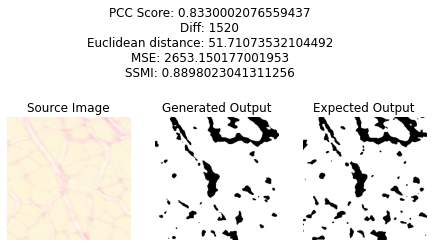

 39%|███▉      | 76/195 [07:15<14:10,  7.15s/it]

Gen_calc is 12781
True calc is 13096
76


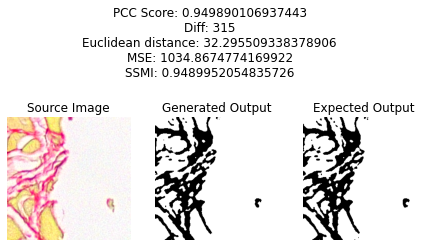

 39%|███▉      | 77/195 [07:19<12:13,  6.22s/it]

Gen_calc is 34008
True calc is 32218
77


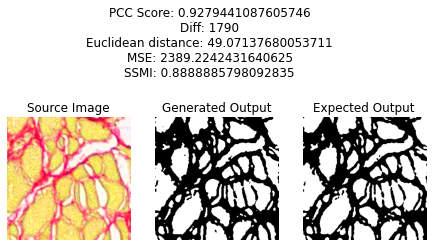

 40%|████      | 78/195 [07:23<10:51,  5.57s/it]

Gen_calc is 33131
True calc is 34036
78


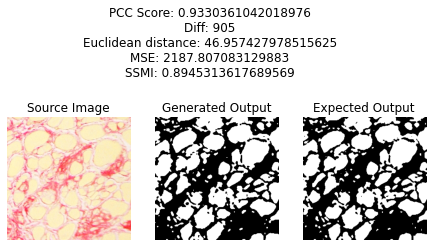

 41%|████      | 79/195 [07:27<09:53,  5.11s/it]

Gen_calc is 14
True calc is 0
79


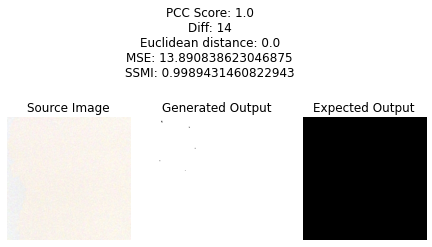

 41%|████      | 80/195 [07:37<12:19,  6.43s/it]

Gen_calc is 4388
True calc is 5297
80


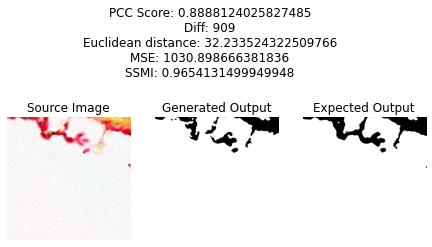

 42%|████▏     | 81/195 [07:41<10:56,  5.76s/it]

Gen_calc is 3700
True calc is 3511
81


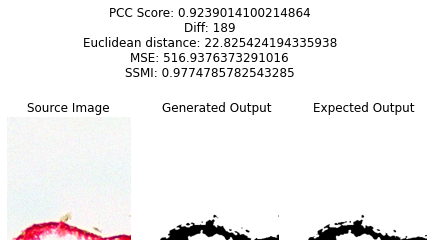

 42%|████▏     | 82/195 [07:45<09:52,  5.24s/it]

Gen_calc is 6809
True calc is 6958
82


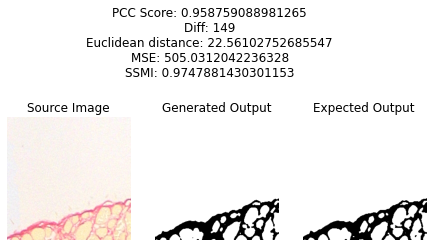

 43%|████▎     | 83/195 [07:49<09:24,  5.04s/it]

Gen_calc is 36243
True calc is 44358
83


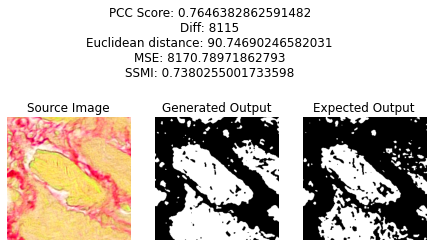

 43%|████▎     | 84/195 [07:54<08:55,  4.82s/it]

Gen_calc is 10290
True calc is 9617
84


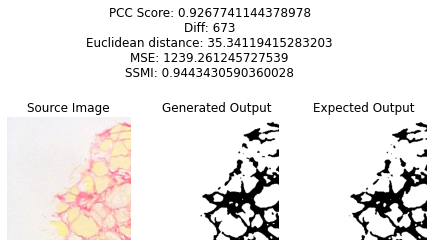

 44%|████▎     | 85/195 [07:58<08:26,  4.61s/it]

Gen_calc is 12901
True calc is 12120
85


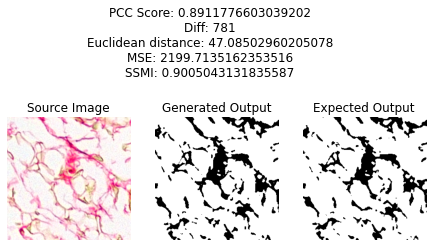

 44%|████▍     | 86/195 [08:02<08:01,  4.42s/it]

Gen_calc is 8
True calc is 76
86


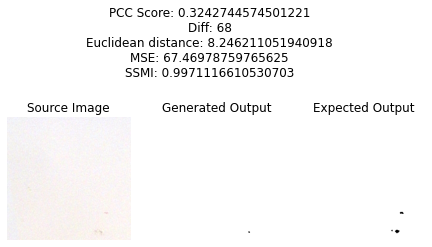

 45%|████▍     | 87/195 [08:07<08:25,  4.69s/it]

Gen_calc is 34710
True calc is 37795
87


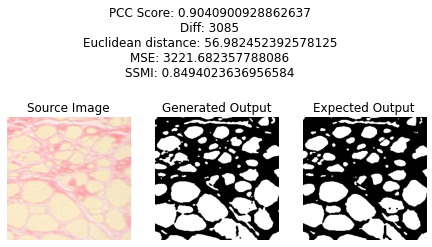

 45%|████▌     | 88/195 [08:11<08:01,  4.50s/it]

Gen_calc is 767
True calc is 788
88


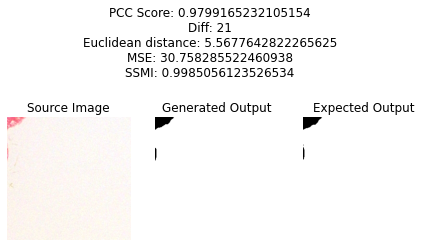

 46%|████▌     | 89/195 [08:15<07:49,  4.43s/it]

Gen_calc is 17164
True calc is 13532
89


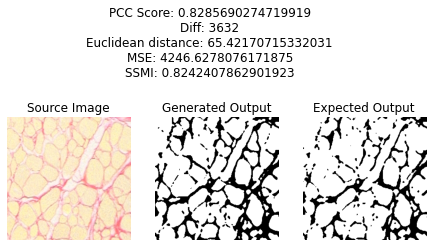

 46%|████▌     | 90/195 [08:20<07:37,  4.35s/it]

Gen_calc is 15095
True calc is 15561
90


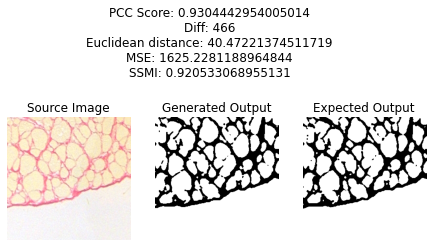

 47%|████▋     | 91/195 [08:24<07:23,  4.26s/it]

Gen_calc is 35262
True calc is 37429
91


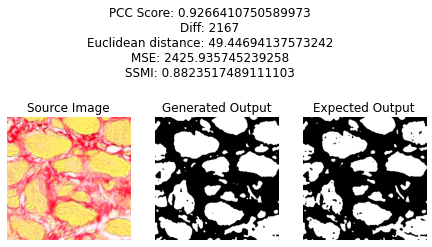

 47%|████▋     | 92/195 [08:28<07:28,  4.35s/it]

Gen_calc is 4384
True calc is 3007
92


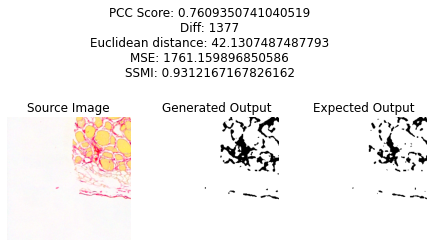

 48%|████▊     | 93/195 [08:32<07:19,  4.31s/it]

Gen_calc is 26316
True calc is 29195
93


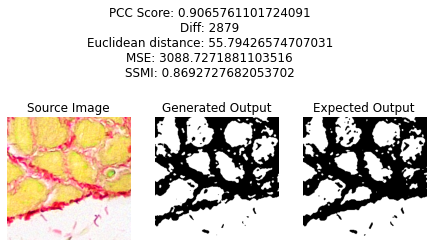

 48%|████▊     | 94/195 [08:37<07:09,  4.25s/it]

Gen_calc is 28069
True calc is 28027
94


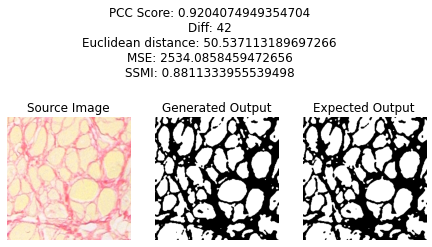

 49%|████▊     | 95/195 [08:41<06:57,  4.18s/it]

Gen_calc is 12271
True calc is 12628
95


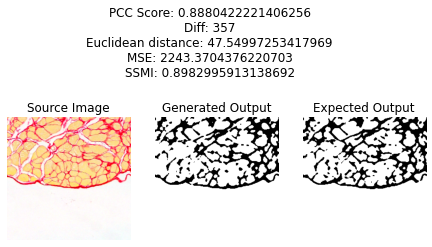

 49%|████▉     | 96/195 [08:45<06:46,  4.11s/it]

Gen_calc is 324
True calc is 338
96


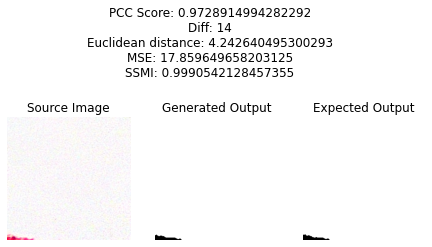

 50%|████▉     | 97/195 [08:48<06:37,  4.06s/it]

Gen_calc is 43073
True calc is 43152
97


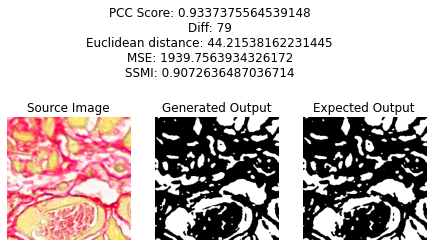

 50%|█████     | 98/195 [08:53<06:37,  4.10s/it]

Gen_calc is 4
True calc is 0
98


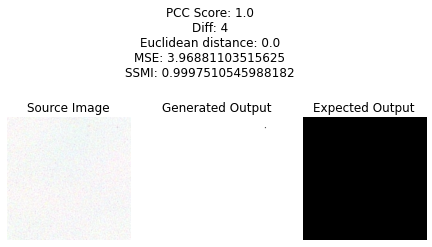

 51%|█████     | 99/195 [09:02<09:17,  5.81s/it]

Gen_calc is 13068
True calc is 12017
99


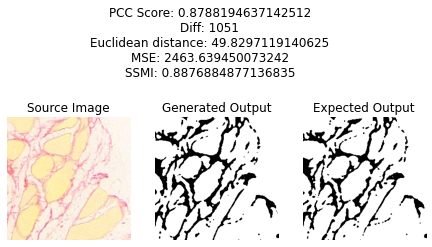

 51%|█████▏    | 100/195 [09:09<09:27,  5.98s/it]

Gen_calc is 29573
True calc is 28052
100


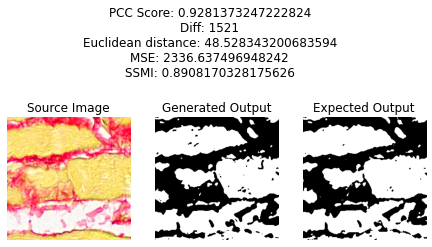

 52%|█████▏    | 101/195 [09:13<08:27,  5.40s/it]

Gen_calc is 558
True calc is 595
101


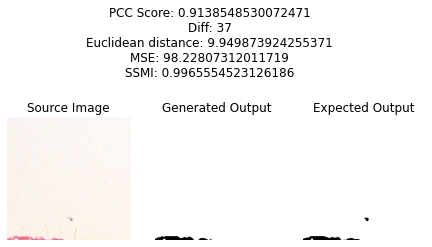

 52%|█████▏    | 102/195 [09:17<07:45,  5.01s/it]

Gen_calc is 6243
True calc is 6292
102


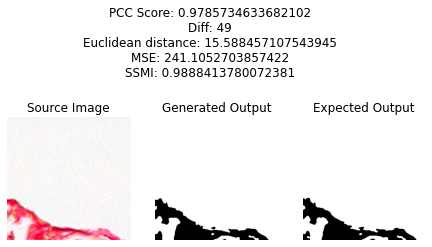

 53%|█████▎    | 103/195 [09:21<07:12,  4.70s/it]

Gen_calc is 26748
True calc is 26945
103


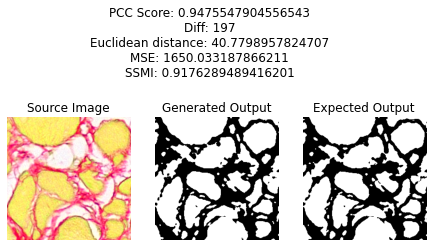

 53%|█████▎    | 104/195 [09:25<06:50,  4.51s/it]

Gen_calc is 32329
True calc is 32050
104


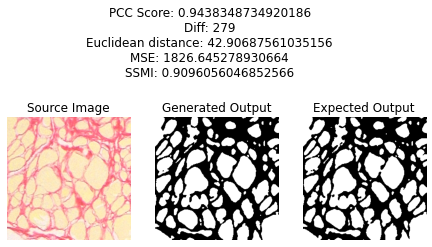

 54%|█████▍    | 105/195 [09:29<06:32,  4.36s/it]

Gen_calc is 29251
True calc is 30244
105


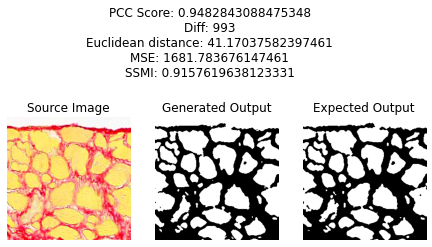

 54%|█████▍    | 106/195 [09:33<06:21,  4.29s/it]

Gen_calc is 17142
True calc is 17983
106


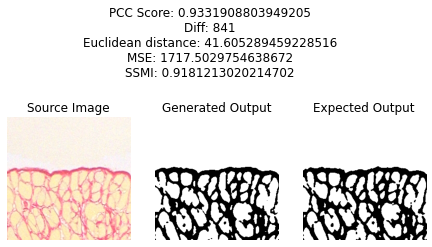

 55%|█████▍    | 107/195 [09:38<06:18,  4.30s/it]

Gen_calc is 21046
True calc is 20698
107


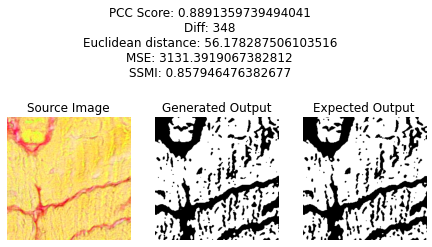

 55%|█████▌    | 108/195 [09:42<06:06,  4.21s/it]

Gen_calc is 1527
True calc is 1584
108


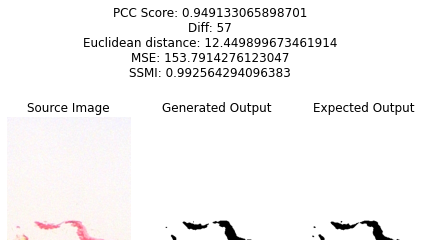

 56%|█████▌    | 109/195 [09:46<06:06,  4.26s/it]

Gen_calc is 20
True calc is 34
109


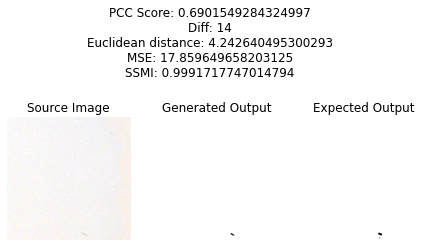

 56%|█████▋    | 110/195 [09:50<06:08,  4.34s/it]

Gen_calc is 41398
True calc is 44074
110


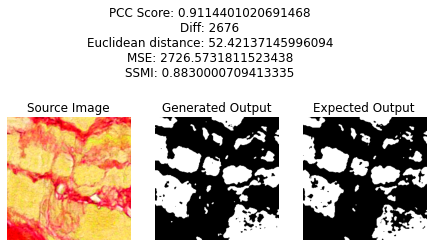

 57%|█████▋    | 111/195 [09:55<05:58,  4.27s/it]

Gen_calc is 5564
True calc is 5653
111


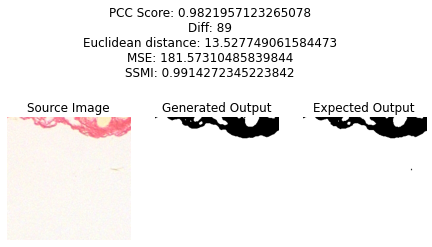

 57%|█████▋    | 112/195 [09:59<05:50,  4.23s/it]

Gen_calc is 5345
True calc is 5133
112


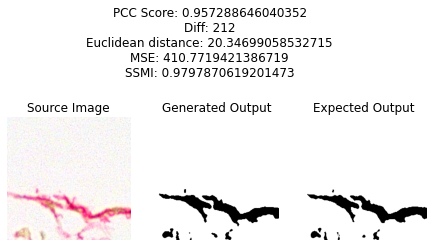

 58%|█████▊    | 113/195 [10:04<06:21,  4.66s/it]

Gen_calc is 25790
True calc is 27363
113


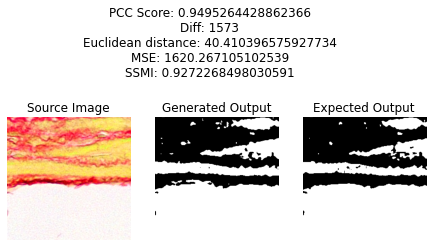

 58%|█████▊    | 114/195 [10:08<06:04,  4.50s/it]

Gen_calc is 16615
True calc is 15901
114


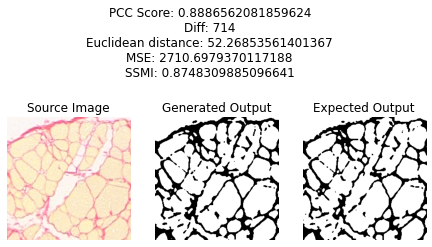

 59%|█████▉    | 115/195 [10:13<05:51,  4.39s/it]

Gen_calc is 8
True calc is 2
115


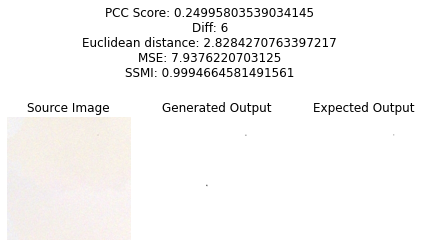

 59%|█████▉    | 116/195 [10:17<05:48,  4.41s/it]

Gen_calc is 10021
True calc is 10060
116


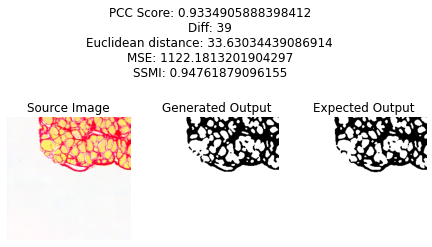

 60%|██████    | 117/195 [10:21<05:35,  4.30s/it]

Gen_calc is 6996
True calc is 8433
117


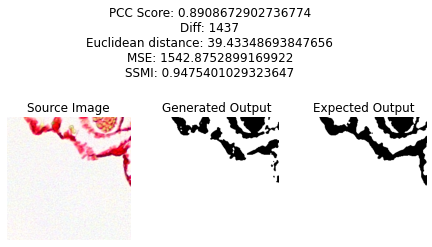

 61%|██████    | 118/195 [10:25<05:28,  4.27s/it]

Gen_calc is 2069
True calc is 2051
118


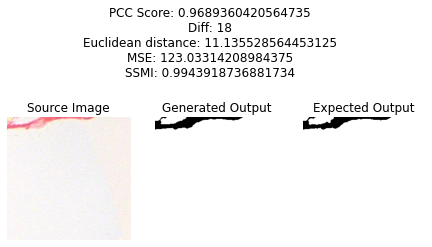

 61%|██████    | 119/195 [10:30<05:34,  4.40s/it]

Gen_calc is 34355
True calc is 37930
119


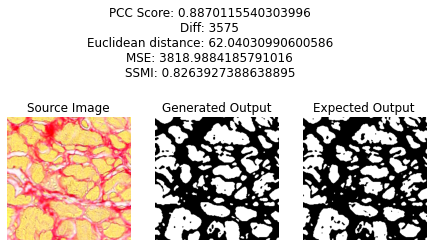

 62%|██████▏   | 120/195 [10:34<05:24,  4.32s/it]

Gen_calc is 33631
True calc is 35834
120


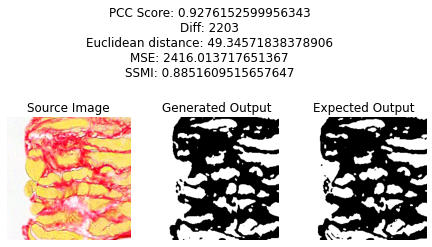

 62%|██████▏   | 121/195 [10:38<05:14,  4.25s/it]

Gen_calc is 0
True calc is 0
121


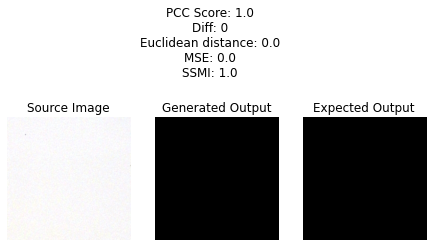

 63%|██████▎   | 122/195 [10:51<08:21,  6.87s/it]

Gen_calc is 12283
True calc is 11231
122


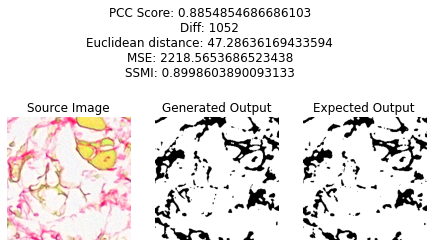

 63%|██████▎   | 123/195 [10:55<07:16,  6.07s/it]

Gen_calc is 9940
True calc is 11472
123


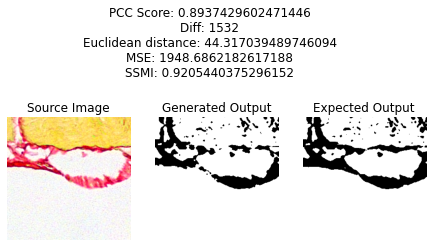

 64%|██████▎   | 124/195 [11:00<06:33,  5.54s/it]

Gen_calc is 1426
True calc is 1639
124


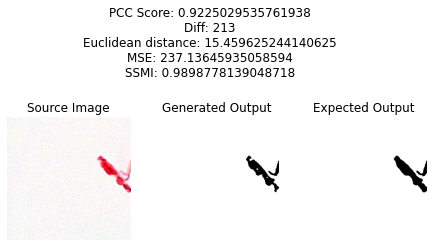

 64%|██████▍   | 125/195 [11:04<05:57,  5.10s/it]

Gen_calc is 17704
True calc is 16152
125


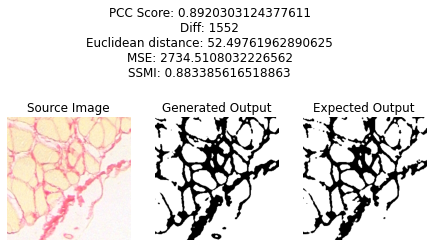

 65%|██████▍   | 126/195 [11:10<06:15,  5.44s/it]

Gen_calc is 21336
True calc is 21171
126


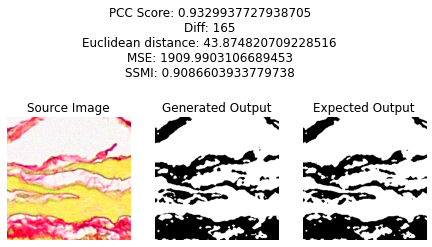

 65%|██████▌   | 127/195 [11:14<05:40,  5.01s/it]

Gen_calc is 3
True calc is 0
127


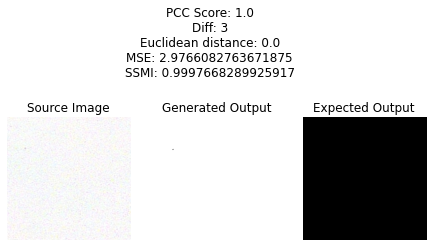

 66%|██████▌   | 128/195 [11:24<07:08,  6.40s/it]

Gen_calc is 65536
True calc is 0
128


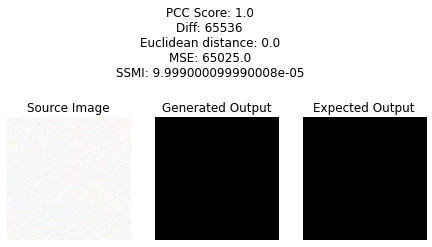

 66%|██████▌   | 129/195 [11:33<08:06,  7.37s/it]

Gen_calc is 24840
True calc is 24515


 67%|██████▋   | 130/195 [11:37<06:48,  6.28s/it]

Gen_calc is 44919
True calc is 50096
130


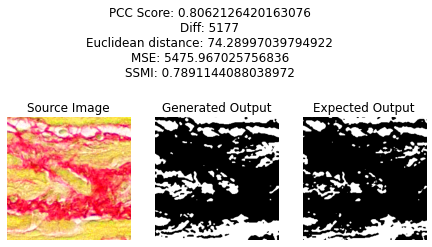

 67%|██████▋   | 131/195 [11:41<06:00,  5.63s/it]

Gen_calc is 7803
True calc is 7516
131


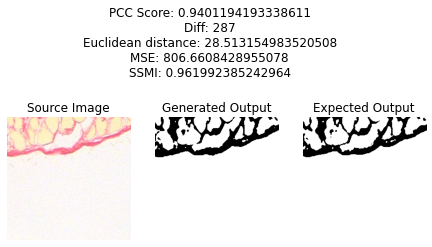

 68%|██████▊   | 132/195 [11:45<05:28,  5.22s/it]

Gen_calc is 31603
True calc is 31184
132


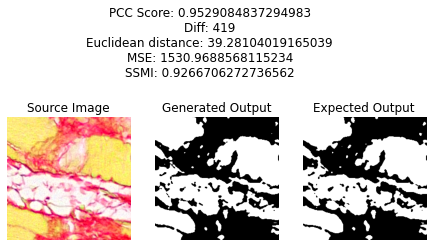

 68%|██████▊   | 133/195 [11:50<05:12,  5.05s/it]

Gen_calc is 20176
True calc is 20864
133


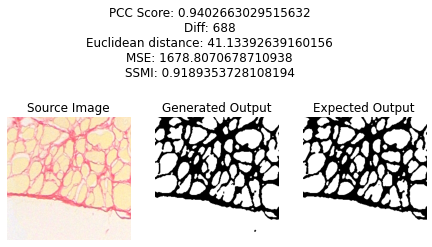

 69%|██████▊   | 134/195 [11:54<04:49,  4.75s/it]

Gen_calc is 5423
True calc is 6137
134


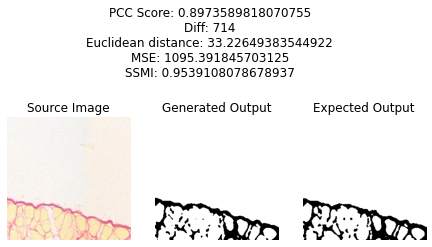

 69%|██████▉   | 135/195 [11:58<04:34,  4.57s/it]

Gen_calc is 12199
True calc is 13325
135


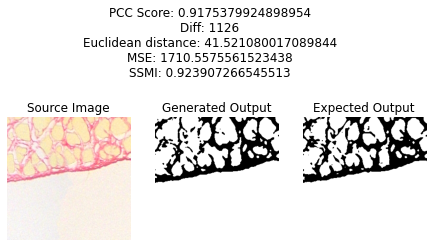

 70%|██████▉   | 136/195 [12:02<04:20,  4.41s/it]

Gen_calc is 10775
True calc is 12514
136


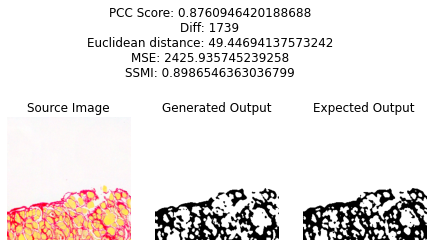

 70%|███████   | 137/195 [12:06<04:08,  4.28s/it]

Gen_calc is 6230
True calc is 5908
137


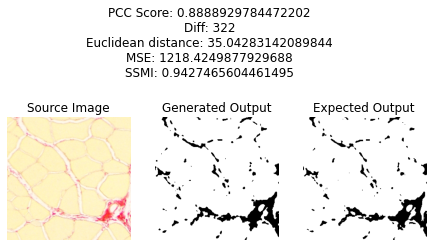

 71%|███████   | 138/195 [12:10<03:58,  4.18s/it]

Gen_calc is 6163
True calc is 6328
138


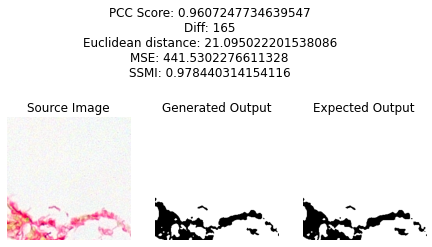

 71%|███████▏  | 139/195 [12:14<03:52,  4.15s/it]

Gen_calc is 4463
True calc is 3073
139


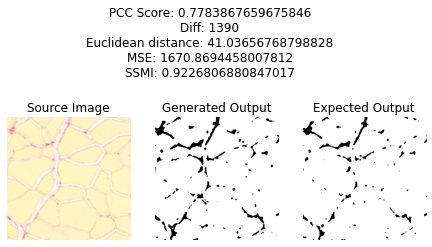

 72%|███████▏  | 140/195 [12:20<04:16,  4.67s/it]

Gen_calc is 33068
True calc is 34036
140


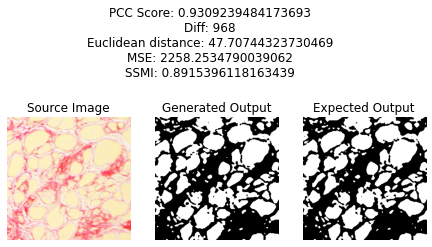

 72%|███████▏  | 141/195 [12:24<04:03,  4.52s/it]

Gen_calc is 23216
True calc is 23664
141


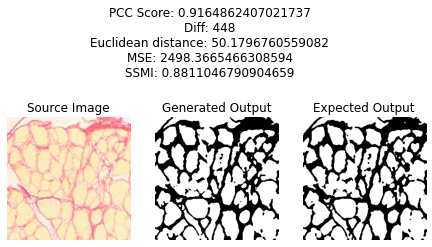

 73%|███████▎  | 142/195 [12:29<03:58,  4.50s/it]

Gen_calc is 16843
True calc is 17567
142


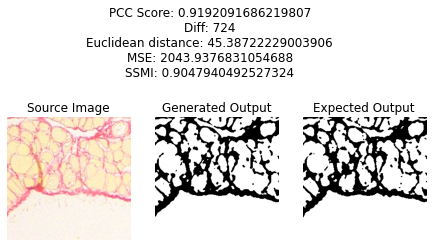

 73%|███████▎  | 143/195 [12:33<03:48,  4.40s/it]

Gen_calc is 41179
True calc is 44214
143


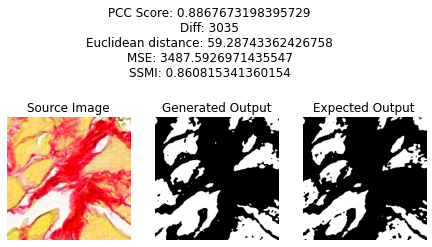

 74%|███████▍  | 144/195 [12:37<03:40,  4.32s/it]

Gen_calc is 4852
True calc is 4644
144


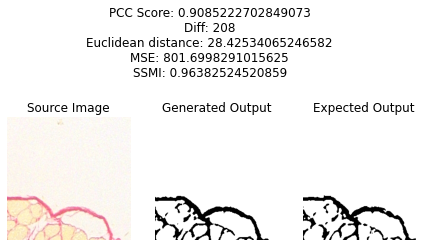

 74%|███████▍  | 145/195 [12:41<03:32,  4.25s/it]

Gen_calc is 7296
True calc is 8263
145


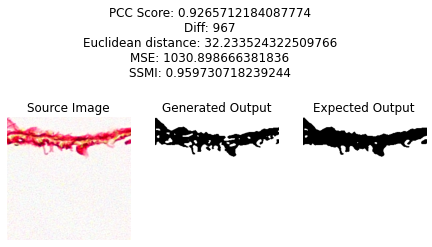

 75%|███████▍  | 146/195 [12:45<03:24,  4.16s/it]

Gen_calc is 8217
True calc is 8078
146


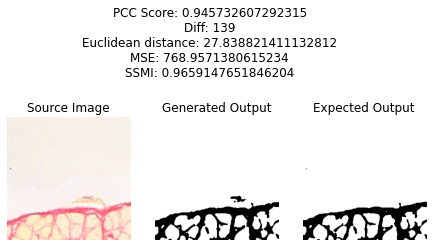

 75%|███████▌  | 147/195 [12:49<03:16,  4.10s/it]

Gen_calc is 30300
True calc is 27810
147


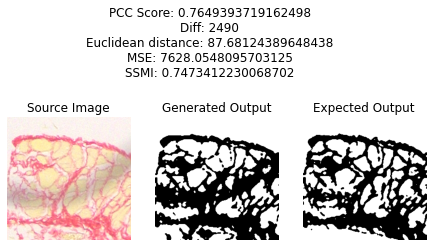

 76%|███████▌  | 148/195 [12:53<03:13,  4.11s/it]

Gen_calc is 33914
True calc is 33937
148


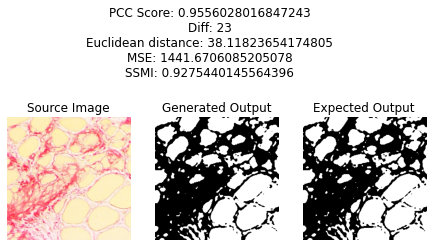

 76%|███████▋  | 149/195 [12:58<03:13,  4.20s/it]

Gen_calc is 32836
True calc is 36253
149


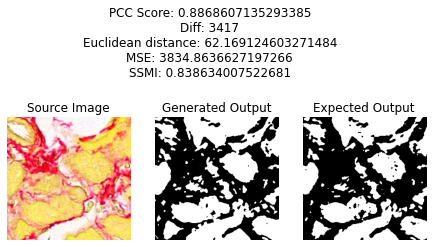

 77%|███████▋  | 150/195 [13:02<03:07,  4.16s/it]

Gen_calc is 20767
True calc is 20063
150


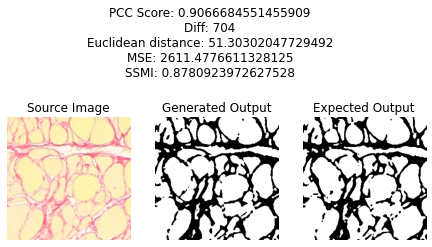

 77%|███████▋  | 151/195 [13:06<03:03,  4.16s/it]

Gen_calc is 11037
True calc is 11005
151


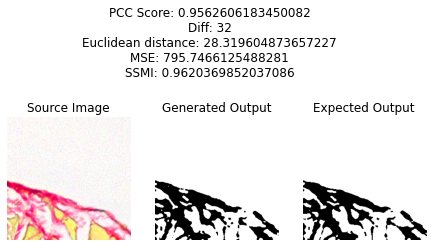

 78%|███████▊  | 152/195 [13:10<03:02,  4.24s/it]

Gen_calc is 22465
True calc is 22410
152


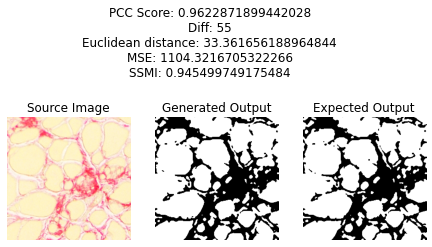

 78%|███████▊  | 153/195 [13:16<03:19,  4.76s/it]

Gen_calc is 16
True calc is 47
153


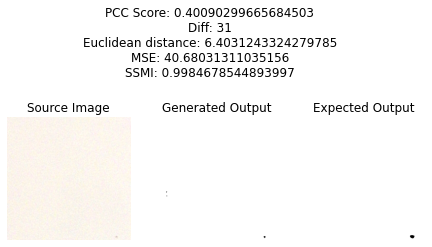

 79%|███████▉  | 154/195 [13:20<03:04,  4.50s/it]

Gen_calc is 0
True calc is 0
154


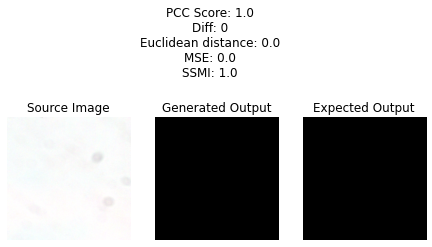

 79%|███████▉  | 155/195 [13:33<04:39,  6.99s/it]

Gen_calc is 41593
True calc is 43136
155


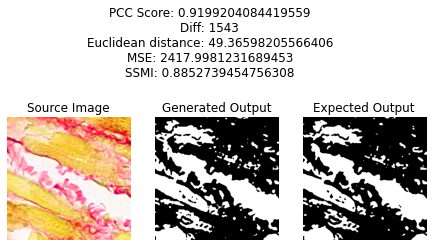

 80%|████████  | 156/195 [13:37<04:01,  6.20s/it]

Gen_calc is 5221
True calc is 7395
156


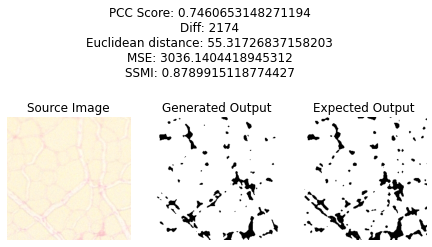

 81%|████████  | 157/195 [13:41<03:30,  5.55s/it]

Gen_calc is 23113
True calc is 22069
157


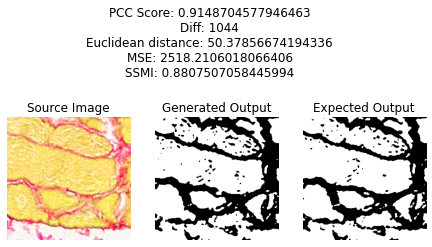

 81%|████████  | 158/195 [13:46<03:11,  5.17s/it]

Gen_calc is 36598
True calc is 44489
158


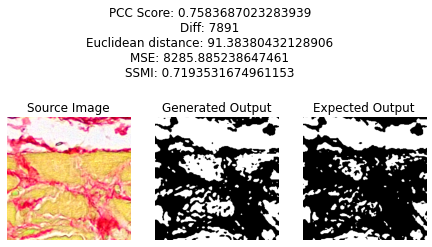

 82%|████████▏ | 159/195 [13:50<03:01,  5.04s/it]

Gen_calc is 27410
True calc is 27639
159


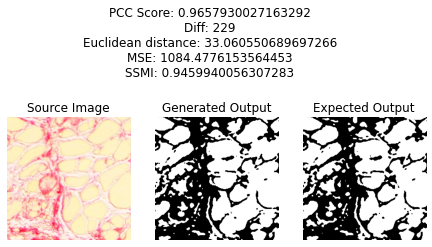

 82%|████████▏ | 160/195 [13:54<02:46,  4.77s/it]

Gen_calc is 19749
True calc is 19730
160


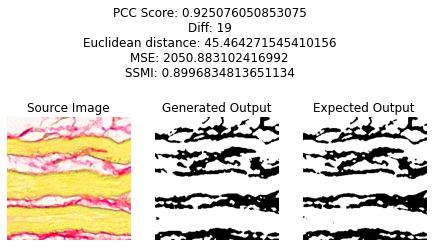

 83%|████████▎ | 161/195 [13:59<02:35,  4.58s/it]

Gen_calc is 6475
True calc is 6442
161


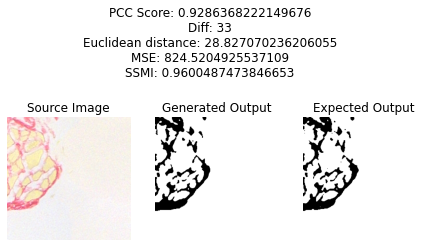

 83%|████████▎ | 162/195 [14:03<02:25,  4.41s/it]

Gen_calc is 29384
True calc is 29302
162


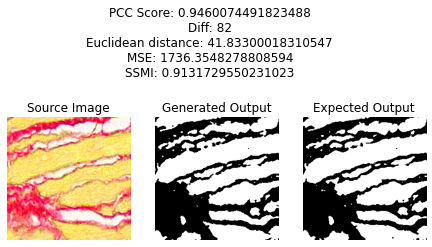

 84%|████████▎ | 163/195 [14:07<02:18,  4.31s/it]

Gen_calc is 23934
True calc is 22275
163


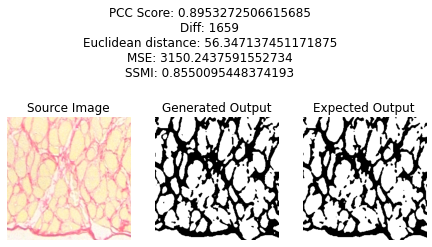

 84%|████████▍ | 164/195 [14:11<02:10,  4.22s/it]

Gen_calc is 0
True calc is 0
164


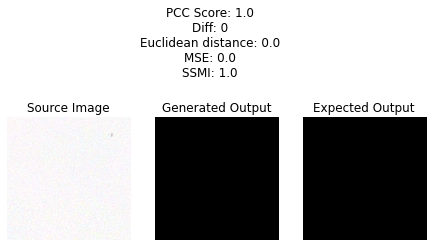

 85%|████████▍ | 165/195 [14:24<03:26,  6.89s/it]

Gen_calc is 74
True calc is 74
165


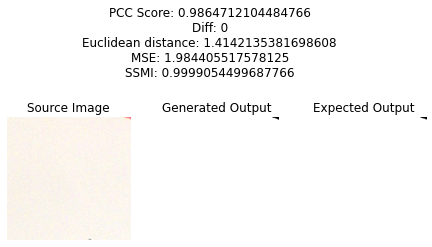

 85%|████████▌ | 166/195 [14:31<03:18,  6.85s/it]

Gen_calc is 34806
True calc is 34035
166


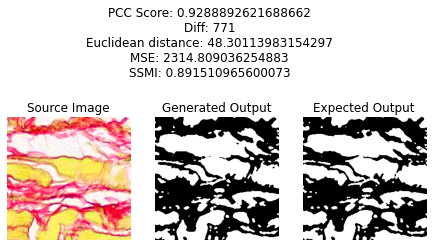

 86%|████████▌ | 167/195 [14:35<02:48,  6.02s/it]

Gen_calc is 1184
True calc is 1292


 86%|████████▌ | 168/195 [14:38<02:22,  5.28s/it]

Gen_calc is 6
True calc is 2
168


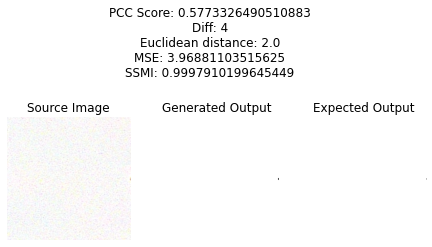

 87%|████████▋ | 169/195 [14:42<02:06,  4.88s/it]

Gen_calc is 29277
True calc is 29725
169


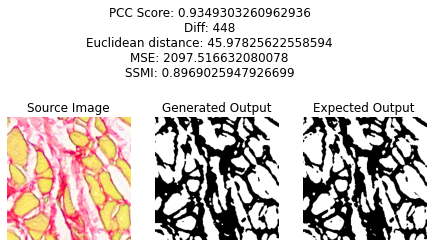

 87%|████████▋ | 170/195 [14:46<01:56,  4.65s/it]

Gen_calc is 0
True calc is 0
170


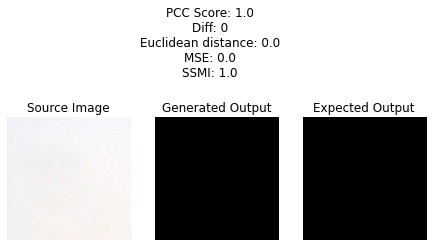

 88%|████████▊ | 171/195 [14:59<02:51,  7.15s/it]

Gen_calc is 28395
True calc is 26723
171


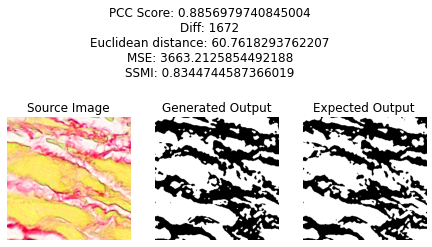

 88%|████████▊ | 172/195 [15:04<02:25,  6.32s/it]

Gen_calc is 13663
True calc is 14683
172


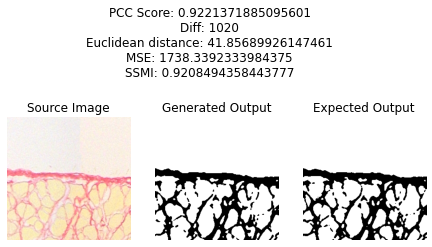

 89%|████████▊ | 173/195 [15:08<02:08,  5.86s/it]

Gen_calc is 21700
True calc is 22304
173


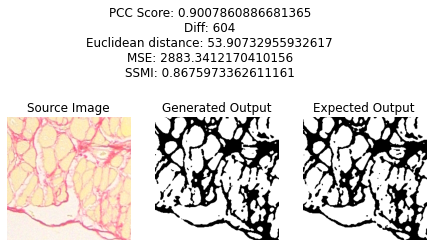

 89%|████████▉ | 174/195 [15:12<01:51,  5.29s/it]

Gen_calc is 855
True calc is 915
174


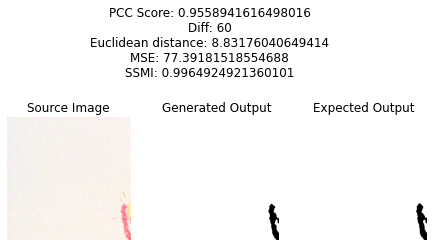

 90%|████████▉ | 175/195 [15:17<01:38,  4.95s/it]

Gen_calc is 65536
True calc is 0
175


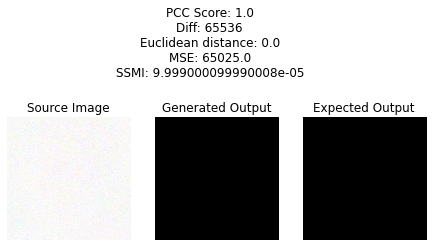

 90%|█████████ | 176/195 [15:26<01:59,  6.29s/it]

Gen_calc is 26217
True calc is 26802
176


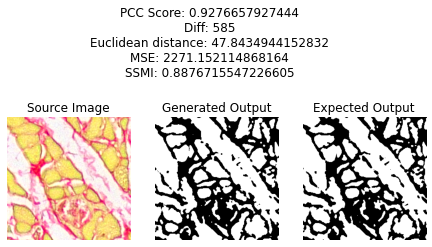

 91%|█████████ | 177/195 [15:30<01:40,  5.61s/it]

Gen_calc is 11
True calc is 0
177


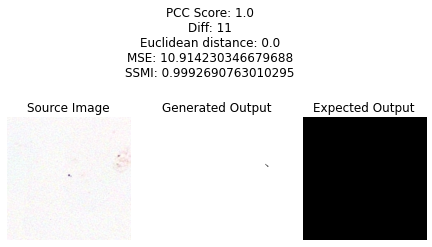

 91%|█████████▏| 178/195 [15:40<01:55,  6.80s/it]

Gen_calc is 48421
True calc is 54469
178


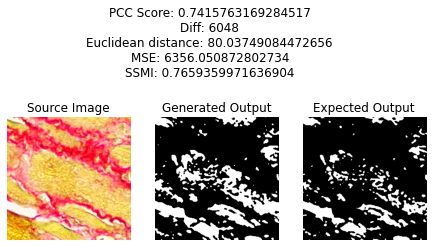

 92%|█████████▏| 179/195 [15:44<01:37,  6.07s/it]

Gen_calc is 30338
True calc is 28100
179


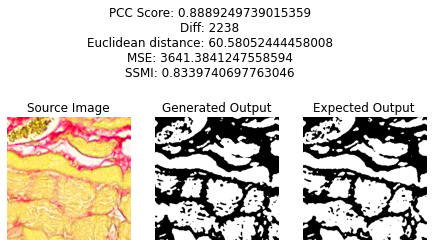

 92%|█████████▏| 180/195 [15:51<01:34,  6.31s/it]

Gen_calc is 5503
True calc is 3845
180


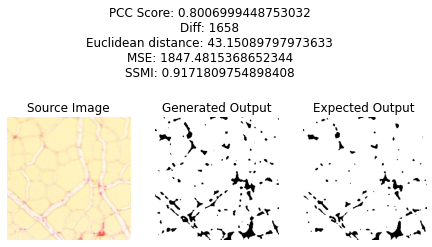

 93%|█████████▎| 181/195 [15:55<01:18,  5.59s/it]

Gen_calc is 28980
True calc is 26888
181


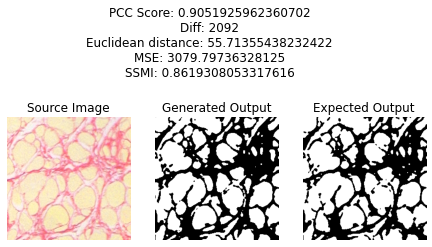

 93%|█████████▎| 182/195 [15:59<01:06,  5.14s/it]

Gen_calc is 25270
True calc is 26454
182


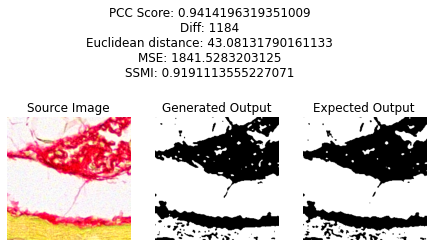

 94%|█████████▍| 183/195 [16:03<00:57,  4.81s/it]

Gen_calc is 40931
True calc is 24591
183


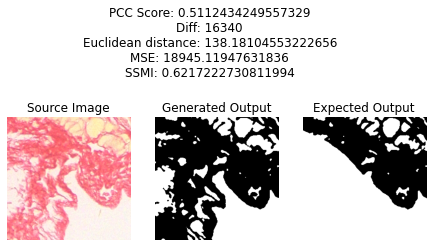

 94%|█████████▍| 184/195 [16:07<00:50,  4.59s/it]

Gen_calc is 8174
True calc is 8632
184


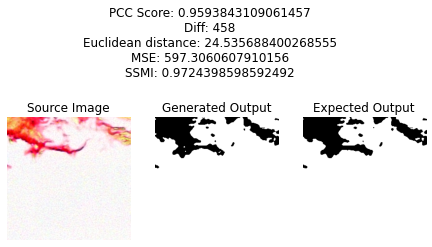

 95%|█████████▍| 185/195 [16:11<00:44,  4.41s/it]

Gen_calc is 65536
True calc is 0
185


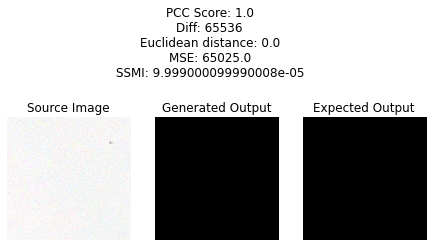

 95%|█████████▌| 186/195 [16:21<00:54,  6.08s/it]

Gen_calc is 24014
True calc is 26251
186


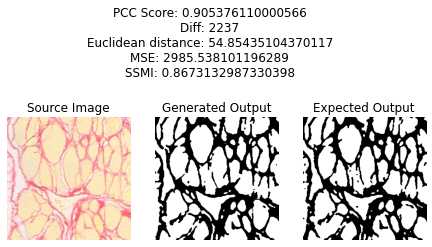

 96%|█████████▌| 187/195 [16:25<00:44,  5.56s/it]

Gen_calc is 5547
True calc is 6042
187


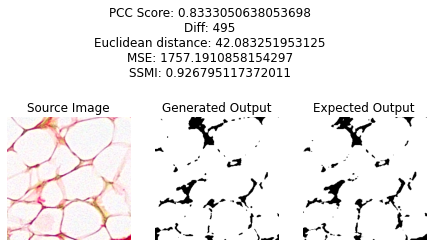

 96%|█████████▋| 188/195 [16:30<00:37,  5.35s/it]

Gen_calc is 30581
True calc is 31895
188


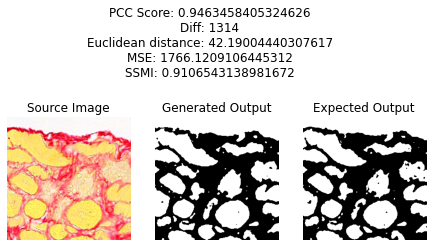

 97%|█████████▋| 189/195 [16:34<00:29,  4.99s/it]

Gen_calc is 10572
True calc is 11383
189


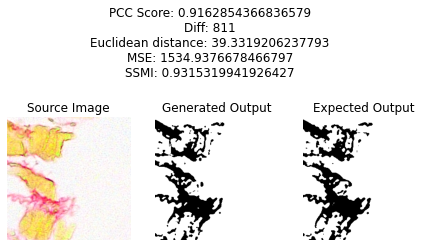

 97%|█████████▋| 190/195 [16:38<00:23,  4.70s/it]

Gen_calc is 15716
True calc is 16005
190


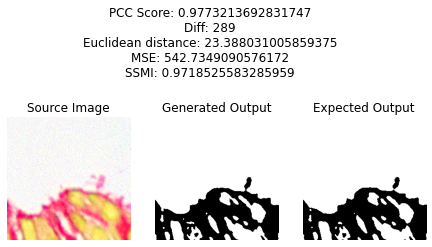

 98%|█████████▊| 191/195 [16:42<00:17,  4.49s/it]

Gen_calc is 38571
True calc is 38516
191


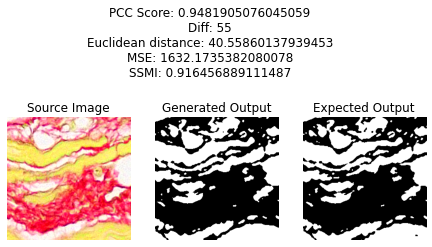

 98%|█████████▊| 192/195 [16:46<00:13,  4.40s/it]

Gen_calc is 38466
True calc is 38310
192


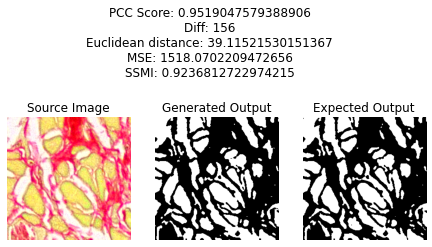

 99%|█████████▉| 193/195 [16:53<00:09,  4.93s/it]

Gen_calc is 15
True calc is 0
193


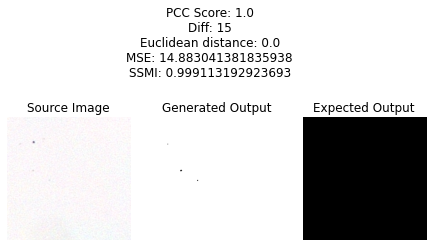

 99%|█████████▉| 194/195 [17:02<00:06,  6.34s/it]

Gen_calc is 24702
True calc is 24798
194


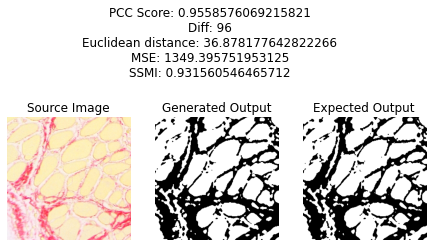

100%|██████████| 195/195 [17:07<00:00,  5.27s/it]

PCC score: 0.9 with standard deviation 0.13.
FQM absolute difference per sample: 2315.19 with standard deviation 9326.83.
FQM balanced difference per sample: 1033.63.
FQM correlation: 0.7829.
Euclidean distance: 34.28, with std 23.07
MSE 3028.48, with std 9195.68
SSMI 0.91, with std 0.15
pix acc mean is  0.9534258720202323
miou is  0.7981738046882548


In [9]:
#%%time
###
### Don't forget to change the test set and the run date
###

model = load_model(model_run, compile=False)
for l in tqdm(range(samples)):

    src_image, tar_image = X1[[l]], X2[[l]]
    invariant_generator = invariant_datagen.flow(
    src_image)
    invariant_generator.next()


    invariant =  invariant_generator[0].copy()

    src_image = invariant  
    
    
    
    
    
    gen_image = model.predict(src_image)
    gen = (gen_image + abs(gen_image.min())) / 2.0
    white, black, thresh1 = threshold_fx.threshold_fx(A1, l, 0)
    if white != 0:
        gen_calc, threshgen = threshold_fx.threshold_gen(gen, white)
        true_calc, threshtar = threshold_fx.threshold_gen(tar_image, white)   
    else:
        gen_calc = 0
        true_calc = 0
        threshgen = np.full((thresh1.shape), 255)
        threshtar = np.full((thresh1.shape), 255)
    if np.mean(threshtar) == 0:
        true_calc = 0
        threshtar = np.full((thresh1.shape), 255)
    
    l1.append(gen_calc)
    l2.append(true_calc)
    print('Gen_calc is', gen_calc)
    print("True calc is", true_calc)
    
    
    src = cv2.cvtColor(src_image.squeeze(), cv2.COLOR_BGR2RGB)

    gen = np.array(threshgen)
    tar = np.array(threshtar)
    
    a = gen
    b = tar

    c = np.array((a-np.min(a))/(np.max(a)-np.min(a)))
    d = np.array((b-np.min(b))/(np.max(b)-np.min(b)))

    m = np.ravel(c)
    n = np.ravel(d)
    
    ms = mse(gen, tar)
    s = measure.compare_ssim(gen, tar, multichannel=True)
    mses.append(ms)
    mmsis.append(s)

    try:
        dst[l][0] = distance.euclidean(m, n)
    except:
        dst[l][0] = 0

    O = gen.ravel()
    G = tar.ravel()


    pcc ,p = pearsonr(O,G)
    if math.isnan(pcc):
        pccscore = 1.0
    else:
        pccscore = pcc
    pcc_sp[l][0] = pccscore

    tp = 0
    tn = 0
    fp = 0
    fn = 0
    for i in range(threshgen.flatten().shape[0]):
        gen_pix = threshgen.flatten()[i]
        tar_pix = threshtar.flatten()[i]
        curve_tar.append(tar_pix)
        curve_gen.append(gen_pix)
        if gen_pix == 0:
            if tar_pix == 0:

                tp += 1
            else:

                fp += 1
        elif gen_pix == 255:
            if tar_pix == 255:

                tn += 1
            else:

                fn += 1
    try:
        pix_acc = (tp + tn) / (tp + tn + fp + fn)

        iou = tp / (tp + fp + fn)
        dice = (2 * tp) / ((2 * tp) + fp + fn)
    except:
        pix_acc = 1
        iou = 1
        dice = 1
    pix_acc_list.append(pix_acc)
    iou_list.append(iou)
    dice_list.append(dice)

    num = random.randint(0, 100)
    if num > 0: 
        print(l)
        src = (src + 1) / 2
        fig, ax = plt.subplots(nrows = 1, ncols = 3, figsize = (7.5, 5))
        fig.suptitle(f"PCC Score: {pccscore}\nDiff: {abs(gen_calc - true_calc)}\nEuclidean distance: {dst[l][0]}\nMSE: {ms}\nSSMI: {s}")
        ax[0].set_title(f'Source Image')
        ax[0].imshow(src, cmap='gray')
        ax[0].axis('off')
        ax[1].set_title('Generated Output')
        ax[1].imshow(threshgen, cmap='gray')
        ax[1].axis('off')
        ax[2].set_title('Expected Output')
        ax[2].imshow(threshtar, cmap='gray')
        ax[2].axis('off')
        plt.show()

    

avg_dst = np.average(dst, axis = 0)
std_dst = np.std(dst, axis = 0)

avg = np.average(pcc_sp, axis = 0)
std = np.std(pcc_sp, axis = 0)
pcc_score  = str(avg)
pcc_std = str(std)


diff = 0
diffuse = list()
for i in range(samples):
    diffuse.append(abs(l1[i] - l2[i]))
diff = np.sum(diffuse)
mean_errorcalc = np.mean(diffuse)
std_errorcalc = np.std(diffuse)
diffr = 0
for i in range(len(l1)):
    diffr += (l1[i] - l2[i])
correlation, p_value = stats.pearsonr(l1, l2)

pix_acc_mean = statistics.mean(pix_acc_list)
miou = statistics.mean(iou_list)
dice_mean = statistics.mean(dice_list)

print(f"PCC score: {round(float(avg[0]), 2)} with standard deviation {round(float(std[0]), 2)}.")
print(f"FQM absolute difference per sample: {round(diff / samples, 2)} with standard deviation {round(std_errorcalc, 2)}.\nFQM balanced difference per sample: {round(diffr / samples, 2)}.\nFQM correlation: {round(correlation, 4)}.")
print(f"Euclidean distance: {round(float(avg_dst[0]), 2)}, with std {round(float(std_dst[0]), 2)}")
print(f"MSE {round(float(np.mean(mses)), 2)}, with std {round(float(np.std(mses)), 2)}")
print(f"SSMI {round(float(np.mean(mmsis)), 2)}, with std {round(float(np.std(mmsis)), 2)}")
print('pix acc mean is ', pix_acc_mean)
print('miou is ', miou)

In [10]:
max(diffuse)

65536

In [11]:
fpr1, tpr1, thresh1 = roc_curve(curve_tar, curve_gen, pos_label=255)
print(f'fpr1 {fpr1}, tpr1 {tpr1} thresh1 {thresh1}')
auc_score1 = roc_auc_score(curve_tar, curve_gen)
print(f'auc_score is {auc_score1}')

fpr1 [0.         0.06381968 1.        ], tpr1 [0.         0.95891139 1.        ] thresh1 [256 255   0]
auc_score is 0.9475458557297197


In [12]:
import pickle

with open("curve_tar_test.txt", "wb") as fp:   #Pickling
    pickle.dump(curve_tar, fp)

In [13]:
random_probs = [0 for i in range(len(curve_tar))]
p_fpr, p_tpr, _ = roc_curve(curve_tar, random_probs, pos_label=255)

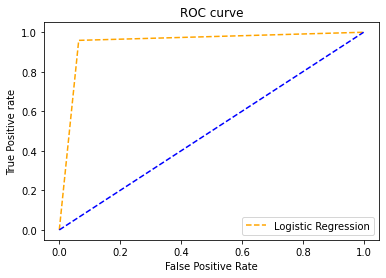

In [14]:
plt.plot(fpr1, tpr1, linestyle='--',color='orange', label='Logistic Regression')
plt.plot(p_fpr, p_tpr, linestyle='--', color='blue')
plt.title('ROC curve')
# x label
plt.xlabel('False Positive Rate')
# y label
plt.ylabel('True Positive rate')
plt.legend(loc='best')
plt.show();

In [15]:
for a,i in enumerate(diffuse):
    print(str(a) + ": " + str(i))

0: 310
1: 167
2: 585
3: 856
4: 1519
5: 1461
6: 88
7: 90
8: 19
9: 0
10: 0
11: 70
12: 954
13: 706
14: 27
15: 2239
16: 0
17: 46
18: 1293
19: 8
20: 3516
21: 2572
22: 321
23: 723
24: 2
25: 1576
26: 321
27: 89
28: 1537
29: 333
30: 2266
31: 1773
32: 16
33: 598
34: 2272
35: 0
36: 244
37: 765
38: 635
39: 49
40: 0
41: 293
42: 0
43: 3
44: 98
45: 36
46: 1124
47: 3482
48: 20
49: 419
50: 10
51: 286
52: 738
53: 423
54: 1886
55: 627
56: 1403
57: 9
58: 246
59: 1711
60: 254
61: 24
62: 120
63: 410
64: 175
65: 890
66: 44
67: 0
68: 8
69: 6
70: 32
71: 11348
72: 0
73: 115
74: 65536
75: 1520
76: 315
77: 1790
78: 905
79: 14
80: 909
81: 189
82: 149
83: 8115
84: 673
85: 781
86: 68
87: 3085
88: 21
89: 3632
90: 466
91: 2167
92: 1377
93: 2879
94: 42
95: 357
96: 14
97: 79
98: 4
99: 1051
100: 1521
101: 37
102: 49
103: 197
104: 279
105: 993
106: 841
107: 348
108: 57
109: 14
110: 2676
111: 89
112: 212
113: 1573
114: 714
115: 6
116: 39
117: 1437
118: 18
119: 3575
120: 2203
121: 0
122: 1052
123: 1532
124: 213
125: 1552
1

In [16]:
top = diffuse.index(max(diffuse))
top

74

In [17]:
max(mses)

65025.0

In [18]:
top = mses.index(max(mses))
top

74

In [19]:
    src_image, tar_image = X1[[top]], X2[[top]]
    invariant_generator = invariant_datagen.flow(
    src_image)
    invariant_generator.next()


    invariant =  invariant_generator[0].copy()

    src_image = invariant  
    
    
    
    
    
    gen_image = model.predict(src_image)
    gen = (gen_image + abs(gen_image.min())) / 2.0
    white, black, thresh1 = threshold_fx.threshold_fx(A1, top, 0)
    if white != 0:
        gen_calc, threshgen = threshold_fx.threshold_gen(gen, white)
        true_calc, threshtar = threshold_fx.threshold_gen(tar_image, white)   
    else:
        gen_calc = 0
        true_calc = 0
        threshgen = np.zeros((thresh1.shape))
        threshtar = np.zeros((thresh1.shape))
    if np.mean(threshtar) == 0:
        true_calc = 0
        threshtar = np.full((thresh1.shape), 255)

In [20]:
gen_calc

65536

In [ ]:
true_calc

In [ ]:
white

In [ ]:
source = src_image.squeeze()
source = (source + 1) / 2.0

In [ ]:
plt.imshow(source, cmap='gray')
plt.show()

In [ ]:
plt.imshow(threshgen, cmap='gray')

In [ ]:
plt.imshow(threshtar, cmap='gray')

In [ ]:
test_df = pd.read_csv('test_evals.csv')
test_df.head()

In [ ]:
data = {'Run_date':  date_of_run,
        'PCC_score': [round(float(avg[0]), 2)],
        'pcc_std': [round(float(std[0]), 2)],
       'fqm_absolute': [round(diff / samples, 2)   ],
       'fqm_std': [round(std_errorcalc, 2)],
       'fqm_balanced': [round(diffr / samples, 2)],
       'fqm_correlation': [round(correlation, 4)],
       'euclidean_dist': [round(float(avg_dst[0]), 2)],
       'euclidean_std': [round(float(std_dst[0]), 2)],
       'mse': [round(float(np.mean(mses)), 2)],
       'mse_std': [round(float(np.std(mses)), 2)],
       'SSIM': [round(float(np.mean(mmsis)), 2)],
              'Pixel acc': [round(float(pix_acc_mean), 4)],
       'SSIM_std': [round(float(np.std(mmsis)), 2)],
                 'IOU': [round(float(miou), 4)],
          'Dice': [round(float(dice_mean), 4)],
       'description': [description
],
       'model_num': model_number}

In [ ]:
df = pd.DataFrame(data)
df['Run_date'] = pd.to_datetime(df['Run_date'])
frames = [test_df, df]
result = pd.concat(frames)
result.tail()

In [ ]:
result.to_csv('test_evals.csv', index=False)

### Figure burn

In [10]:

model = load_model(model_run, compile=False)
